# Reconstruction via Triangulation

Chun Yu Chang, Tianyi Chen, Yutong Wang, Zerui Wu


---


## 1. Introduction
Triangulation is a method for recovering 3D points from multiple 2D image observations.

**Core question:**  
Given $N$ cameras observing the **same 3-D point** $\mathbf{X}$, how do we recover its 3-D coordinates from 2-D image observations?

$$\mathbf{x}_i = \pi_i(\mathbf{X}) \qquad i = 1, \ldots, N$$

where $\pi_i$ is the projection of camera $i$.

**Key insight:** each camera gives us a ray in 3-D space. The true point lies somewhere on that ray. With two or more cameras, we find where the rays meet.


In [8]:
!pip install ipywidgets

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Line3DCollection
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec

np.random.seed(42)  # reproducibility
plt.rcParams.update({
    'figure.dpi': 120,
    'font.size': 11,
    'axes.titlesize': 13,
})

## 2. Geometric Starting Point: Line-of-Sight (LoS)

### Core Idea

A 2D image observation does not directly provide a 3D position. Instead, it restricts the possible location of the 3D point to a ray extending from the camera center into the scene. This ray is called the **line of sight**.

### Ray Representation

$$\mathbf{r}(t) = \mathbf{o} + t\,\widehat{\mathbf{d}}, \quad t > 0$$

- $\mathbf{o}$: camera center in world coordinates (origin of the ray)
- $\hat{\mathbf{d}}$: ray direction, determined by the pixel location and camera parameters
- $t$: distance along the ray (unknown)

### Goal of Triangulation

Given rays from $N$ cameras, find the 3D point $\widehat{\mathbf{X}}$ that is closest to all of them.

$$\widehat{\mathbf{X}} = \arg\min_{\mathbf{X}} \sum_{i=1}^{N} d(\mathbf{X},\, \text{Ray}_i)^2$$


---
## 2a. Ideal Case: Rays Meet Exactly (No Noise)

In a perfect world, the two rays cross **exactly** at $\mathbf{X}$.

We can recover $\mathbf{X}$ by solving:
$$\mathbf{o}_1 + t_1\widehat{\mathbf{d}}_1 = \mathbf{o}_2 + t_2\widehat{\mathbf{d}}_2$$

This is a simple linear system — solve for $t_1$, $t_2$.  
With perfect rays the error should be essentially **zero**.

In [10]:
# Build two rays pointing at a known 3-D point
X_true = np.array([1.5, 1.0, 5.0])   # the point we want to recover

o1 = np.array([-2., 0., 0.])          # camera 1 position
o2 = np.array([ 2., 0., 0.])          # camera 2 position

# Direction = (point - camera), normalised to unit length
d1 = X_true - o1;  d1 = d1 / np.linalg.norm(d1)
d2 = X_true - o2;  d2 = d2 / np.linalg.norm(d2)

print(f'Camera 1 at {o1},  ray direction: {d1.round(3)}')
print(f'Camera 2 at {o2},  ray direction: {d2.round(3)}')

Camera 1 at [-2.  0.  0.],  ray direction: [0.566 0.162 0.808]
Camera 2 at [2. 0. 0.],  ray direction: [-0.098  0.195  0.976]


=== IDEAL CASE (no noise) ===
True point    : [1.5 1.  5. ]
Reconstructed : [1.5 1.  5. ]


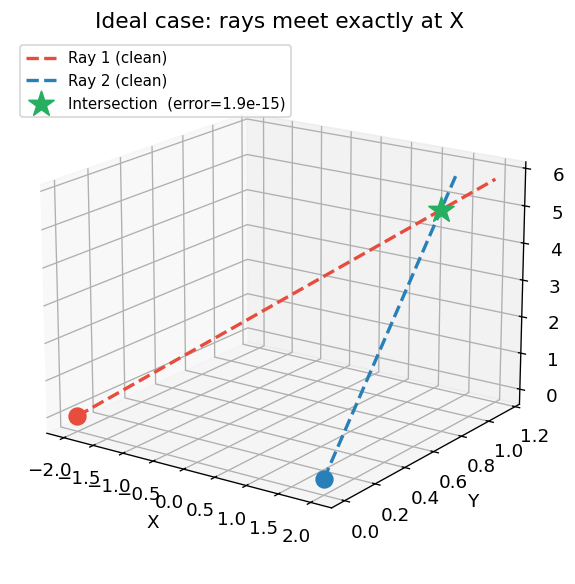

In [11]:
# Ideal case: noise-free rays, exact intersection
def los_triangulate(o1, d1, o2, d2):
    c     = np.dot(d1, d2)
    denom = 1.0 - c**2
    delta = o2 - o1
    t1 = (np.dot(delta, d1) - c * np.dot(delta, d2)) / denom
    t2 = (c * np.dot(delta, d1) - np.dot(delta, d2)) / denom
    p1    = o1 + t1 * d1
    p2    = o2 + t2 * d2
    X_hat = 0.5 * (p1 + p2)
    return X_hat, p1, p2

X_ideal, p1_ideal, p2_ideal = los_triangulate(o1, d1, o2, d2)

print('=== IDEAL CASE (no noise) ===')
print(f'True point    : {X_true}')
print(f'Reconstructed : {X_ideal.round(6)}')

# Visualise ideal case
fig = plt.figure(figsize=(8, 5))
ax  = fig.add_subplot(111, projection='3d')

for o, d, col, lbl in [(o1, d1, '#e74c3c', 'Ray 1 (clean)'),
                        (o2, d2, '#2980b9', 'Ray 2 (clean)')]:
    end = o + 1.15 * (X_true - o)
    ax.plot([o[0], end[0]], [o[1], end[1]], [o[2], end[2]],
            color=col, lw=2, ls='--', label=lbl)
    ax.scatter(*o, s=100, c=col, zorder=5)

# Intersection point (gap ≈ 0, so p1 ≈ p2 ≈ X_true)
ax.scatter(*X_ideal, s=250, c='#27ae60', marker='*', zorder=7,
           label=f'Intersection  (error={np.linalg.norm(X_ideal-X_true):.1e})')

ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
ax.set_title('Ideal case: rays meet exactly at X')
ax.legend(fontsize=9, loc='upper left')
ax.view_init(elev=18, azim=-55)
plt.tight_layout()
plt.show()

---
## 2b. Real Case: Rays Miss Each Other (With Noise)

In practice, pixel detections have noise → ray directions are slightly wrong → rays become **skew lines** (miss each other in 3-D).

**Solution (midpoint triangulation):** find the closest points on the two rays and taking their midpoint as the estimated 3-D point.

$${\mathbf{p}} = \frac{\mathbf{q}_1 + \mathbf{q}_2}{2}$$

where $\mathbf{q}_1$, $\mathbf{q}_2$ are the closest points on each ray to the other — same solver, no changes needed.

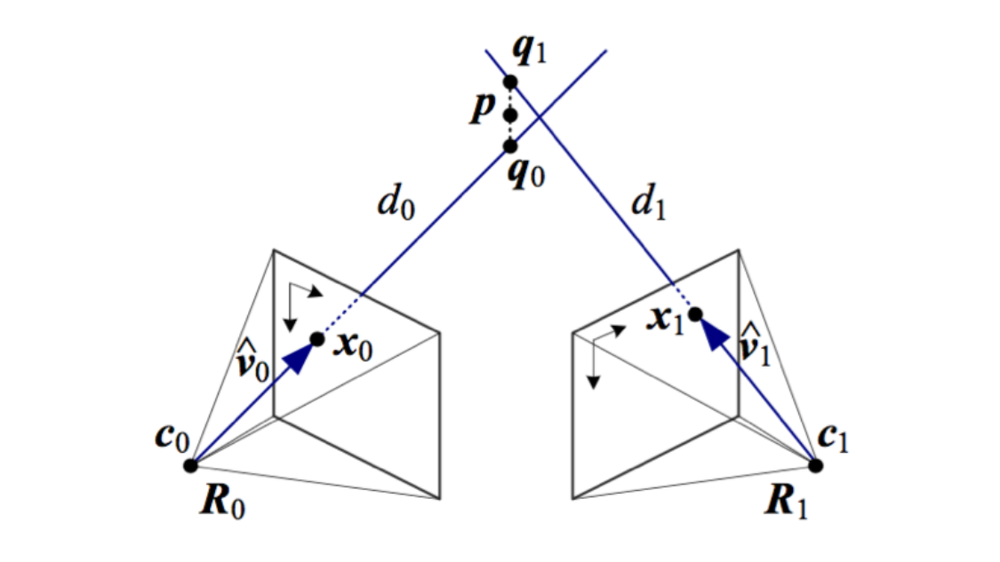


True point   : [1.5 1.  5. ]
Midpoint X̂   : [1.8773 1.0324 5.5153]  error = 0.6395


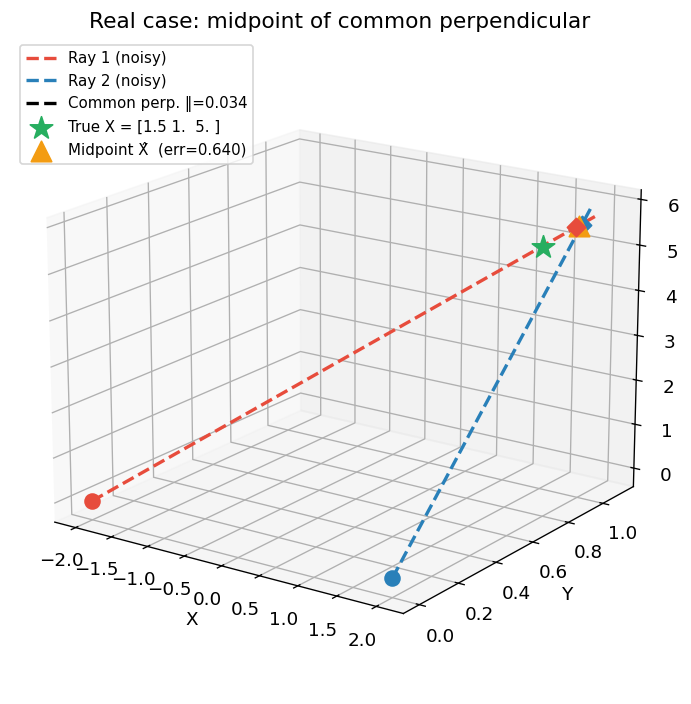

In [12]:
np.random.seed(42)

X_true = np.array([1.5, 1.0, 5.0])
o1 = np.array([-2., 0., 0.])
o2 = np.array([ 2., 0., 0.])

NOISE_STD = 0.05

d1_clean = X_true - o1;  d1_clean /= np.linalg.norm(d1_clean)
d2_clean = X_true - o2;  d2_clean /= np.linalg.norm(d2_clean)

d1_noisy = d1_clean + np.random.randn(3) * NOISE_STD
d2_noisy = d2_clean + np.random.randn(3) * NOISE_STD
d1_noisy /= np.linalg.norm(d1_noisy)
d2_noisy /= np.linalg.norm(d2_noisy)


def los_solve(o1, d1, o2, d2):
    c = np.dot(d1, d2)
    denom = 1.0 - c**2
    if abs(denom) < 1e-10:
        raise ValueError("Rays are (near-)parallel.")
    delta = o2 - o1
    t1 = (np.dot(delta, d1) - c * np.dot(delta, d2)) / denom
    t2 = (c * np.dot(delta, d1) - np.dot(delta, d2)) / denom
    p1 = o1 + t1 * d1
    p2 = o2 + t2 * d2
    return p1, p2, 0.5 * (p1 + p2)


p1, p2, X_mid = los_solve(o1, d1_noisy, o2, d2_noisy)
err_mid  = np.linalg.norm(X_mid - X_true)
perp_len = np.linalg.norm(p2 - p1)

print(f"True point   : {X_true}")
print(f"Midpoint X̂   : {X_mid.round(4)}  error = {err_mid:.4f}")

t_max1 = np.linalg.norm(X_true - o1) * 1.15
t_max2 = np.linalg.norm(X_true - o2) * 1.15

fig = plt.figure(figsize=(8, 6))
ax  = fig.add_subplot(111, projection='3d')

for o, d, t_max, col, lbl in [
        (o1, d1_noisy, t_max1, '#e74c3c', 'Ray 1 (noisy)'),
        (o2, d2_noisy, t_max2, '#2980b9', 'Ray 2 (noisy)')]:
    end = o + t_max * d
    ax.plot([o[0], end[0]], [o[1], end[1]], [o[2], end[2]],
            color=col, lw=2, ls='--', label=lbl)
    ax.scatter(*o, s=80, c=col, zorder=5)

# The two endpoints of the common perpendicular
ax.scatter(*p1, s=60, c='#e74c3c', marker='D', zorder=6)
ax.scatter(*p2, s=60, c='#2980b9', marker='D', zorder=6)

# Common Perpendicular
ax.plot([p1[0], p2[0]], [p1[1], p2[1]], [p1[2], p2[2]],
        'k--', lw=2, label=f'Common perp. ‖={perp_len:.3f}')

# True point
ax.scatter(*X_true, s=200, c='#27ae60', marker='*', zorder=7,
           label=f'True X = {X_true}')

# Midpoint
ax.scatter(*X_mid, s=150, c='#f39c12', marker='^', zorder=7,
           label=f'Midpoint X̂  (err={err_mid:.3f})')

ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
ax.set_title('Real case: midpoint of common perpendicular')
ax.legend(fontsize=9, loc='upper left')
ax.view_init(elev=18, azim=-55)

plt.tight_layout()
plt.show()

## Recent Paper (2025): RapidPoseTriangulation

Bermuth, D., Poeppel, A., & Reif, W. (2026). *RapidPoseTriangulation: Multi-view Multi-person Whole-body Human Pose Triangulation in a Millisecond.* arXiv:2503.21692.


RapidPoseTriangulation is a fast, learning-free pipeline for **multi-view multi-person 3-D human pose estimation**.

The main idea is to first generate many possible 3-D pose proposals from 2-D detections, then remove bad proposals early and merge the remaining valid ones in 3-D space.

### Workflow

| Step | Operation |
|---|---|
| 1 | Detect 2-D poses in each camera view |
| 2 | Create all possible cross-view 2-D pose pairs |
| 3 | Filter pairs using the previous 3D poses |
| 4 | Select core joints |
| 5 | **Triangulate each 2-D pose pair into a 3-D proposal using midpoint triangulation** |
| 6 | Drop proposals outside the room |
| 7 | Reproject into 2D views |
| 8 | Calculate reprojection error to original 2D poses |
| 9 | Group remaining 3-D proposals in 3-D space |
| 10 | **Triangulate again with all joints** |
| 11 | Merge grouped proposals into final 3-D poses |
| 12 | Drop clearly invalid persons |

In this paper, midpoint triangulation is used twice:

1. First, it triangulates only the core joints to quickly generate initial 3-D proposals.
2. Later, after incorrect pose pairs are removed, it triangulates again using all joints to produce more complete 3-D proposals.

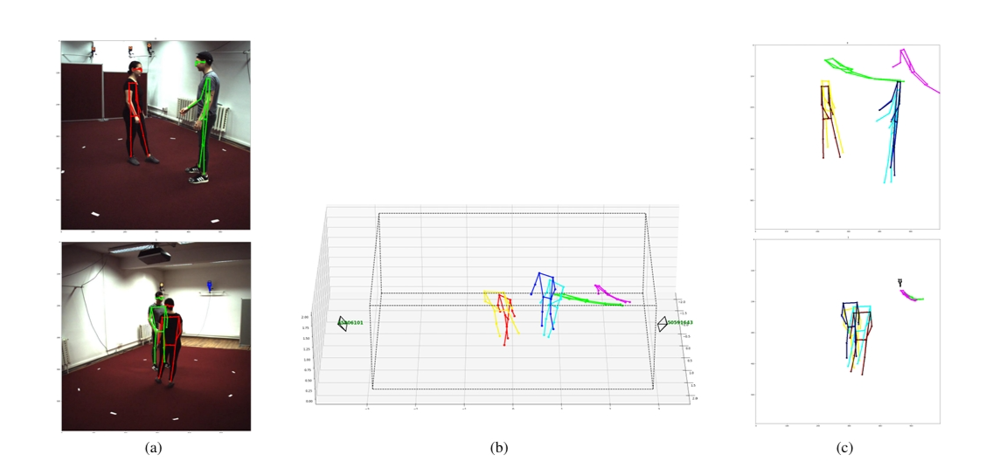



The authors replaced OpenCV's SVD-based triangulation with simple midpoint triangulation **because it was much faster and almost as accurate** in their experiments.

> Instead of OpenCV's SVD-based triangulation, a simple mid-point triangulation was implemented, which was much faster and almost as accurate in the experiments. In summary the switch to standard C++ functions led to a significant relative speedup of around 0.1 ms (Bermuth et al., 2026).


---
## 3. Linear Method

##  Introduction to Direct Linear Transformation (DLT) Method
Triangulation tries to recover a 3D point from its 2D projections in two or more images. Geometrically, each image point defines a line of sight from the camera center into 3D space. In the ideal case, two lines of sight intersect at the true 3D point. But with noise, the rays usually do not intersect exactly:
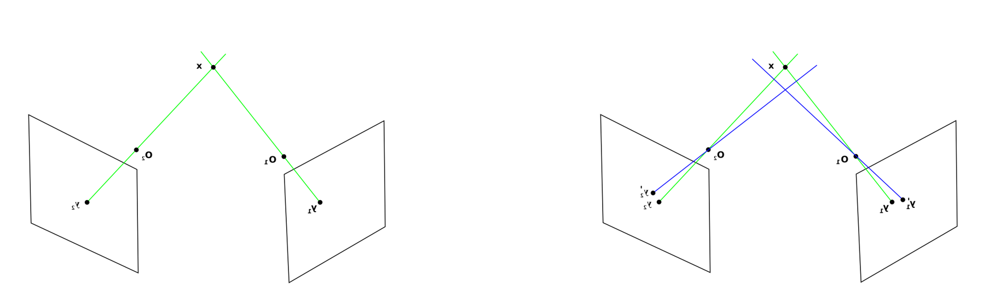

The linear method avoids explicitly computing the intersection of rays. Instead, it starts from the camera projection equation.

## Linear Method: Problem Setup
For each 3D point, we are given:

- A 3D point in homogeneous coordinates:

$$
\mathbf{X}=\begin{bmatrix}X&Y&Z&W\end{bmatrix}^T.
$$

- A camera matrix:

$$
P = K[R\mid t] \in \mathbb{R}^{3\times 4}.
$$

- An image observation:

$$
\mathbf{x}=\begin{bmatrix}u&v&1\end{bmatrix}^T.
$$

The projection model is:

$$
\mathbf{x} \sim P\mathbf{X}.
$$

Linear method: use the collinearity constraint, since $\mathbf{x}$  and $\ P\mathbf{X}$ represent the same homogeneous point, their cross product must be zero.

$$
\mathbf{x} \times P\mathbf{X} = 0
$$

Then we can form a linear system

$$
A\mathbf{X}=0.
$$

In homogeneous coordinates, the resulting linear system can be solved using  singular value decomposition(SVD).


## Linear Method: From projection to a linear system

Let the three rows of $P$ be

$$
P = \begin{bmatrix}
\mathbf{p}_1^T \\
\mathbf{p}_2^T \\
\mathbf{p}_3^T
\end{bmatrix}.
$$

Then

$$
P\mathbf{X} =
\begin{bmatrix}
\mathbf{p}_1^T\mathbf{X} \\
\mathbf{p}_2^T\mathbf{X} \\
\mathbf{p}_3^T\mathbf{X}
\end{bmatrix}.
$$

The inhomogeneous pixel coordinates (u,v) satisfy:

$$
u = \frac{\mathbf{p}_1^T\mathbf{X}}{\mathbf{p}_3^T\mathbf{X}},
\qquad
v = \frac{\mathbf{p}_2^T\mathbf{X}}{\mathbf{p}_3^T\mathbf{X}}.
$$

Multiplying by the denominator gives two linear equations in $\mathbf{X}$:

$$
u(\mathbf{p}_3^T\mathbf{X}) - \mathbf{p}_1^T\mathbf{X}=0,
$$

$$
v(\mathbf{p}_3^T\mathbf{X}) - \mathbf{p}_2^T\mathbf{X}=0.
$$

Equivalently,

$$
(u\mathbf{p}_3^T-\mathbf{p}_1^T)\mathbf{X}=0,
\qquad
(v\mathbf{p}_3^T-\mathbf{p}_2^T)\mathbf{X}=0.
$$

__Each camera__ contributes __two__ independent linear equations.
By stacking equations from two cameras, we obtain $A\mathbf{X}=0$.

## Recall: Singular Value Decomposition (SVD)

For any matrix $A \in \mathbb{R}^{m \times n}$, SVD factorizes $A$ as

$$
A = U\Sigma V^T.
$$

Here,

$$
U \in \mathbb{R}^{m \times m}
$$

is an orthogonal matrix,

$$
V \in \mathbb{R}^{n \times n}
$$

is also an orthogonal matrix, and

$$
\Sigma \in \mathbb{R}^{m \times n}
$$

is a diagonal matrix containing the singular values:

$$
\sigma_1 \geq \sigma_2 \geq \cdots \geq \sigma_n \geq 0.
$$

The columns of $V$ are called the __right singular vectors__ of $A$, and $Av_i = \sigma_i u_i$.

The singular values describe how much the matrix $A$ stretches each corresponding direction.

## Why SVD is useful for linear triangulation

In linear triangulation, we obtain a homogeneous linear system:

$$
A\mathbf{X}=0.
$$

However, the trivial solution

$$
\mathbf{X}=0
$$

is meaningless, because it does not represent a valid 3D point.

Therefore, we solve the constrained least-squares problem:

$$
\min_{\|\mathbf{X}\|=1} \|A\mathbf{X}\|^2.
$$

Using SVD,

$$
A = U\Sigma V^T.
$$

The solution is the right singular vector corresponding to the smallest singular value:

$$
\| A\mathbf{v}_i \| = \sigma_i ,
\mathbf{X}^* = \mathbf{v}_{\min} .
$$

Equivalently, $\mathbf{X}^*$ is the vector that makes $A\mathbf{X}$ as close to zero as possible.

## Solve $A\mathbf{X}=0$ by SVD
For two cameras $P$ and $P'$ with image observations $(u,v)$ and $(u',v')$, stack the equations:

$$
A\mathbf{X}=0,
$$

where

$$
A = \begin{bmatrix}
u\mathbf{p}_3^T - \mathbf{p}_1^T \\
v\mathbf{p}_3^T - \mathbf{p}_2^T \\
u'\mathbf{p}_3'^T - \mathbf{p}_1'^T \\
v'\mathbf{p}_3'^T - \mathbf{p}_2'^T
\end{bmatrix}.
$$

Impose a scale constraint indirectly by taking the unit-norm right singular vector of $A$ associated with the smallest singular value:

$$
\mathbf{X}^* = \arg\min_{\|\mathbf{X}\|=1}\|A\mathbf{X}\|^2=\begin{bmatrix}X_h&Y_h&Z_h&W_h\end{bmatrix}^T.
$$

Then dehomogenize:

$$
[X,Y,Z]^T=\left[\frac{X_h}{W_h}, \frac{Y_h}{W_h}, \frac{Z_h}{W_h}\right]^T.
$$

The SVD solution minimizes the **algebraic error**:

$$
\|A\mathbf{X}\|^2
$$
To sum up, linear triangulation converts projective geometry into a homogeneous linear least-squares problem. It is fast and simple, but it is not the final statistically optimal solution under image noise.

Demo: We first generate synthetic 3D points and project them into two cameras. Then we add controllable Gaussian noise to the image observations. For each noise level, we reconstruct the 3D points using linear triangulation. The visualization compares the original 3D points with the reconstructed 3D points, while the metrics show the 3D RMSE and the DLT algebraic error.


In [13]:
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(precision=4, suppress=True) #parameters for print

def make_K(fx=800, fy=800, cx=320, cy=240):
    """
    Create camera intrinsic matrix K.
    """
    return np.array([
        [fx, 0,  cx],
        [0,  fy, cy],
        [0,  0,  1],
    ], dtype=float)


def make_projection_matrix(K, R, C):
    """
    Create camera projection matrix P = K [R | t],
    where C is the camera center in world coordinates and t = -RC.
    """
    t = -R @ C.reshape(3, 1)
    Rt = np.hstack([R, t])
    return K @ Rt


def project_points(P, X_world):
    """
    Project 3D Euclidean points into the image plane.

    Input:
        P: 3 x 4 projection matrix
        X_world: N x 3 array of 3D points

    Output:
        x: N x 2 array of image coordinates
    """
    X_h = np.hstack([X_world, np.ones((X_world.shape[0], 1))])#homogeneous
    x_h = (P @ X_h.T).T #projection
    x = x_h[:, :2] / x_h[:, 2:3] #Dehomogenization
    return x


def build_dlt_matrix(Ps, xs):
    """
    Build the DLT matrix A for one 3D point observed by multiple cameras.

    For each camera, from x ~ PX, we obtain two equations:

        (u p3^T - p1^T) X = 0
        (v p3^T - p2^T) X = 0

    Input:
        Ps: list of projection matrices
        xs: list of 2D observations, one per camera

    Output:
        A: stacked linear system matrix
    """
    A_rows = []

    for P, x in zip(Ps, xs):
        u, v = x

        # P[0, :], P[1, :], P[2, :] are p1^T, p2^T, p3^T
        A_rows.append(u * P[2, :] - P[0, :])
        A_rows.append(v * P[2, :] - P[1, :])

    A = np.vstack(A_rows)
    return A


def triangulate_dlt(Ps, xs):
    """
    Triangulate one 3D point using DLT linear triangulation.

    Solve:
        A X_h = 0

    by:
        min ||A X_h||^2 subject to ||X_h|| = 1

    The solution is the right singular vector corresponding to
    the smallest singular value.
    """
    A = build_dlt_matrix(Ps, xs)

    U, S, Vt = np.linalg.svd(A) #SVD

    # Homogeneous 3D point: smallest right singular vector
    X_h = Vt[-1, :]

    # Normalize to unit norm for a consistent algebraic residual
    X_h = X_h / np.linalg.norm(X_h)

    # Dehomogenize: [X_h, Y_h, Z_h, W_h] -> [X_h/W_h, Y_h/W_h, Z_h/W_h]
    if abs(X_h[3]) < 1e-12:
        X = np.full(3, np.nan)
    else:
        X = X_h[:3] / X_h[3]

    # DLT algebraic residual
    algebraic_error = np.linalg.norm(A @ X_h)

    return X, X_h, algebraic_error, S


def triangulate_many_dlt(Ps, x_observations):
    """
    Triangulate many 3D points using DLT.

    Input:
        Ps: list of camera matrices [P1, P2, ...]
        x_observations: list of N x 2 arrays.
                        x_observations[j][i] is the 2D observation
                        of point i in camera j.

    Output:
        X_hat: N x 3 reconstructed 3D points
        X_h_all: N x 4 homogeneous 3D points
        algebraic_errors: N algebraic residuals ||A X_h||
        smallest_singular_values: N smallest singular values of A
    """
    N = x_observations[0].shape[0]

    X_hat = []
    X_h_all = []
    algebraic_errors = []
    smallest_singular_values = []

    for i in range(N):
        xs_i = [xobs[i] for xobs in x_observations]

        Xi, Xh_i, alg_err_i, svals_i = triangulate_dlt(Ps, xs_i)

        X_hat.append(Xi)
        X_h_all.append(Xh_i)
        algebraic_errors.append(alg_err_i)
        smallest_singular_values.append(svals_i[-1])

    return (
        np.vstack(X_hat),
        np.vstack(X_h_all),
        np.array(algebraic_errors),
        np.array(smallest_singular_values),
    )


def dlt_3d_metrics(X_hat, X_true, algebraic_errors, smallest_singular_values):
    """
    Metrics for the DLT linear method.

    We do NOT compute reprojection error here.
    The metrics focus on:
        1. 3D reconstruction error, since this is synthetic data.
        2. DLT algebraic error, which is the actual linear objective.
    """
    point_errors = np.linalg.norm(X_hat - X_true, axis=1)

    metrics = {
        "rmse_3d": np.sqrt(np.mean(point_errors ** 2)),
        "mean_algebraic_error": np.mean(algebraic_errors),
    }

    return metrics

# ------------------------------------------------------------
# Synthetic two-camera setup for DLT linear triangulation
# ------------------------------------------------------------

# Camera intrinsics
K = make_K(fx=800, fy=800, cx=320, cy=240)

# Camera 1: at the world origin, looking along +Z
R1 = np.eye(3)
C1 = np.array([0.0, 0.0, 0.0])
P1 = make_projection_matrix(K, R1, C1)

# Camera 2: shifted along X axis
R2 = np.eye(3)
C2 = np.array([1.0, 0.0, 0.0])
P2 = make_projection_matrix(K, R2, C2)

Ps = [P1, P2]
Rs = [R1, R2]
Cs = [C1, C2]

# Generate synthetic 3D points in front of the cameras
rng = np.random.default_rng(7)
N = 80

X_true = np.column_stack([
    rng.uniform(-1.0, 1.0, N),
    rng.uniform(-0.7, 0.7, N),
    rng.uniform(4.0, 8.0, N),
])

# Clean projections into the two image planes
x1_clean = project_points(P1, X_true)
x2_clean = project_points(P2, X_true)

# Fixed random noise templates.
# We keep these fixed so that moving the slider changes only the noise scale,
# not the random noise pattern.
noise_rng = np.random.default_rng(123)
noise1_unit = noise_rng.normal(0.0, 1.0, x1_clean.shape)
noise2_unit = noise_rng.normal(0.0, 1.0, x2_clean.shape)


def reconstruct_for_noise(noise_sigma_px):
    """
    Add image noise with a chosen standard deviation,
    then reconstruct 3D points using DLT only.
    """
    x1_noisy = x1_clean + noise_sigma_px * noise1_unit
    x2_noisy = x2_clean + noise_sigma_px * noise2_unit

    X_hat, X_h_all, algebraic_errors, smallest_singular_values = triangulate_many_dlt(
        Ps,
        [x1_noisy, x2_noisy],
    )

    metrics = dlt_3d_metrics(
        X_hat,
        X_true,
        algebraic_errors,
        smallest_singular_values,
    )

    metrics["noise_sigma_px"] = noise_sigma_px

    return X_hat, metrics, [x1_noisy, x2_noisy]

In [ ]:
def print_dlt_metrics(metrics):
    """
    Print DLT-only metrics.
    """
    print(f"Noise sigma [pixels]       : {metrics['noise_sigma_px']:.2f}")
    print(f"3D RMSE                    : {metrics['rmse_3d']:.6f}")
    print(f"Mean algebraic error       : {metrics['mean_algebraic_error']:.6e}")


def set_axes_equal(ax):
    """
    Make 3D plot axes have equal scale.
    This makes spatial distance easier to interpret visually.
    """
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    y_range = abs(y_limits[1] - y_limits[0])
    z_range = abs(z_limits[1] - z_limits[0])

    max_range = max([x_range, y_range, z_range])

    x_middle = np.mean(x_limits)
    y_middle = np.mean(y_limits)
    z_middle = np.mean(z_limits)

    ax.set_xlim3d([x_middle - max_range / 2, x_middle + max_range / 2])
    ax.set_ylim3d([y_middle - max_range / 2, y_middle + max_range / 2])
    ax.set_zlim3d([z_middle - max_range / 2, z_middle + max_range / 2])
# @title
# ------------------------------------------------------------
# Interactive animation: DLT reconstruction + metric bar chart
# ------------------------------------------------------------

try:
    import ipywidgets as widgets
    from IPython.display import display
except ImportError:
    raise ImportError("Please install ipywidgets to run this interactive cell.")


# For Google Colab: enable custom widget manager if available
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except Exception:
    pass


# Noise levels used by the slider / animation
noise_levels = np.linspace(0.0, 8.0, 33)

# Fixed axis limits make the motion easier to compare across noise levels.
# If reconstructed points go outside the visible range, enlarge these values.
AXIS_LIMITS = (
    (-2.5, 2.5),   # X axis
    (-2.0, 2.0),   # Y axis
    (3.0, 9.0),    # Z axis
)


# ------------------------------------------------------------
# Cache reconstruction results so the animation is smoother
# ------------------------------------------------------------

_RESULT_CACHE = {}

def get_result_for_level(level_idx):
    """
    Get DLT reconstruction and metrics for a selected noise level.
    Results are cached to avoid repeated SVD computations.
    """
    level_idx = int(level_idx)

    if level_idx not in _RESULT_CACHE:
        sigma_px = float(noise_levels[level_idx])
        X_hat, metrics, _ = reconstruct_for_noise(sigma_px)
        _RESULT_CACHE[level_idx] = (X_hat, metrics)

    return _RESULT_CACHE[level_idx]


# ------------------------------------------------------------
# Metric settings for the bar chart
# ------------------------------------------------------------

metric_keys = [
    "noise_sigma_px",
    "rmse_3d",
    "mean_algebraic_error",
]

metric_names = [
    "Noise sigma",
    "3D RMSE",
    "Mean algebraic error",
]

metric_units = [
    "px",
    "world unit",
    "algebraic",
]


# Precompute metric ranges for normalized bar lengths.
# This is only for visualization because the metrics have different units.
for i in range(len(noise_levels)):
    get_result_for_level(i)

metric_max = {}
for key in metric_keys:
    vals = [_RESULT_CACHE[i][1][key] for i in range(len(noise_levels))]
    metric_max[key] = max(max(vals), 1e-12)


def draw_metric_bar_chart(ax, metrics):
    """
    Draw normalized metric bars.
    The bar length is normalized only for visualization.
    The text labels show the actual metric values.
    """
    raw_values = np.array([metrics[key] for key in metric_keys], dtype=float)
    normalized_values = np.array([
        raw_values[i] / metric_max[metric_keys[i]]
        for i in range(len(metric_keys))
    ])

    y_pos = np.arange(len(metric_keys))

    ax.barh(y_pos, normalized_values)

    ax.set_yticks(y_pos)
    ax.set_yticklabels(metric_names)
    ax.set_xlim(0, 1.15)
    ax.set_xlabel("Normalized value")
    ax.set_title("Current DLT Metrics")

    # Display actual values on the bars
    for i, (norm_val, raw_val, unit) in enumerate(zip(normalized_values, raw_values, metric_units)):
        if metric_keys[i] == "mean_algebraic_error":
            value_text = f"{raw_val:.3e} {unit}"
        else:
            value_text = f"{raw_val:.4f} {unit}"

        ax.text(
            norm_val + 0.03,
            i,
            value_text,
            va="center",
            fontsize=10,
        )

    ax.grid(axis="x", alpha=0.3)

    # Put the first metric at the top
    ax.invert_yaxis()

    note = "Bar lengths are normalized\nbecause units are different."
    ax.text(
        0.02,
        -0.25,
        note,
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment="top",
        bbox=dict(boxstyle="round", alpha=0.12),
    )


def draw_3d_dlt_result(ax, X_true, X_hat, C1, C2, metrics):
    """
    Draw 3D ground-truth points and DLT reconstructed points.
    """
    ax.scatter(
        X_true[:, 0],
        X_true[:, 1],
        X_true[:, 2],
        s=28,
        label="Ground truth 3D points",
    )

    ax.scatter(
        X_hat[:, 0],
        X_hat[:, 1],
        X_hat[:, 2],
        s=35,
        marker="x",
        label="DLT reconstructed 3D points",
    )

    # Draw error lines between true points and reconstructed points
    max_error_lines = 30
    num_lines = min(max_error_lines, X_true.shape[0])

    for a, b in zip(X_true[:num_lines], X_hat[:num_lines]):
        if np.all(np.isfinite(b)):
            ax.plot(
                [a[0], b[0]],
                [a[1], b[1]],
                [a[2], b[2]],
                linewidth=0.8,
                alpha=0.45,
            )

    # Camera centers
    ax.scatter(
        [C1[0], C2[0]],
        [C1[1], C2[1]],
        [C1[2], C2[2]],
        s=80,
        marker="^",
        label="Camera centers",
    )

    ax.text(C1[0], C1[1], C1[2], "  C1")
    ax.text(C2[0], C2[1], C2[2], "  C2")

    ax.set_xlim(AXIS_LIMITS[0])
    ax.set_ylim(AXIS_LIMITS[1])
    ax.set_zlim(AXIS_LIMITS[2])

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")

    ax.set_title(
        f"DLT Linear Triangulation\n"
        f"noise sigma = {metrics['noise_sigma_px']:.2f} px"
    )

    text = (
        f"3D RMSE = {metrics['rmse_3d']:.4f}\n"
        f"Mean algebraic error = {metrics['mean_algebraic_error']:.2e}"
    )

    ax.text2D(
        0.02,
        0.98,
        text,
        transform=ax.transAxes,
        verticalalignment="top",
        bbox=dict(boxstyle="round", alpha=0.15),
    )

    ax.legend(loc="lower left")


# ------------------------------------------------------------
# Widgets
# ------------------------------------------------------------

play = widgets.Play(
    value=4,
    min=0,
    max=len(noise_levels) - 1,
    step=1,
    interval=350,
    description="Press play",
    disabled=False,
)

slider = widgets.IntSlider(
    value=4,
    min=0,
    max=len(noise_levels) - 1,
    step=1,
    description="Noise level",
    continuous_update=False,
    readout=False,
    layout=widgets.Layout(width="500px"),
)

widgets.jslink((play, "value"), (slider, "value"))


def show_dlt_noise_animation(level_idx):
    """
    Update both:
    1. 3D DLT reconstruction visualization
    2. Current metric bar chart
    """
    X_hat, metrics = get_result_for_level(level_idx)

    fig = plt.figure(figsize=(14, 6.5))
    gs = fig.add_gridspec(
        1,
        2,
        width_ratios=[2.1, 1.0],
        wspace=0.25,
    )

    ax_3d = fig.add_subplot(gs[0, 0], projection="3d")
    ax_bar = fig.add_subplot(gs[0, 1])

    draw_3d_dlt_result(
        ax=ax_3d,
        X_true=X_true,
        X_hat=X_hat,
        C1=C1,
        C2=C2,
        metrics=metrics,
    )

    draw_metric_bar_chart(
        ax=ax_bar,
        metrics=metrics,
    )

    plt.show()

    print("DLT metrics:")
    print_dlt_metrics(metrics)


out = widgets.interactive_output(
    show_dlt_noise_animation,
    {"level_idx": slider},
)

display(
    widgets.VBox([
        widgets.HTML(
            "<b> </b>"
        ),
        widgets.HBox([slider]),
        out,
    ])
)



## Recent Work
In recent papers, linear method is mainly used as initialization modules in modern SfM and 3D reconstruction pipelines. Additionally, a common extension is __weighted or uncertainty-aware DLT__, where the rows of the linear system are __weighted__ according to the reliability or uncertainty of each image observation. This keeps the problem linear and SVD-solvable, while reducing the influence of noisy or low-confidence measurements.

__Today's paper__

UPose3D: Uncertainty-Aware 3D Human Pose Estimation with Cross-View and Temporal Cues(ECCV 2024)

Davoodnia V, Ghorbani S, Carbonneau M A, et al. Upose3D: uncertainty-aware 3D human pose estimation with cross-view and temporal cues[C]//European Conference on Computer Vision. Cham: Springer Nature Switzerland, 2024: 19-38.(
https://doi.org/10.48550/arXiv.2404.14634)

Linear Method:
$$
\min_{\|\mathbf{X}\|=1} \|A\mathbf{X}\|^2.
$$

Weighted Linear Method:
$$
\min_{\|\mathbf{X}\|=1} \|WA\mathbf{X}\|^2.
$$
Where reliable points have higher weight while unreliable points have lower weight.

Standard DLT assigns uniform weighting to all projection rays, making the 3D reconstruction highly sensitive to outliers. For instance, if a ietm is clearly visible in Camera 1 but occluded or misdetected in others, the final estimate will be significantly biased toward these erroneous perspectives.

UPose3D: DLT→Weighted DLT→Uncertainty-aware probabilistic triangulation

Step1: Use Machine learning method(Residual Log-likelihood Estimation) to get a pdf
 $P(x \mid I_i) \sim N(x; \hat{\mu}_i, \hat{\Sigma}_i)$, where P is the probability that joint point appears at location x and is approximately Gaussian, the mean value means the position and variance reflects the reliability. (Dataset:COCO WholeBody&MPII Human Pose -dataset for whole-body pose estimation with body joint label,https://github.com/jin-s13/COCO-WholeBody, https://www.mpi-inf.mpg.de/departments/computer-vision-and-machine-learning/software-and-datasets/mpii-human-pose-dataset)

 Step2:Pick a reference view(e.g. camera1). If the predicted point in another view(e.g. camera 2), is correct, then the corresponding point in the reference view should lie on the __epipolar line__ induced by that camera-2 point. By projecting the predicted point from a reference view to the epipolar line we can get a 2D point cloud

True point in camera 1: [352. 256.]
Predicted point in camera 1, mu1_pred: [387. 211.]
Predicted point in camera 2, mu2_pred: [316.775 242.099]
Epipolar line in camera 1: a*u + b*v + c = 0
line = [  0.1483  -0.9889 209.1396]
Distance from mu1_pred to epipolar line before projection: 57.88180740476881
Distance after projection: 2.842170943040401e-14


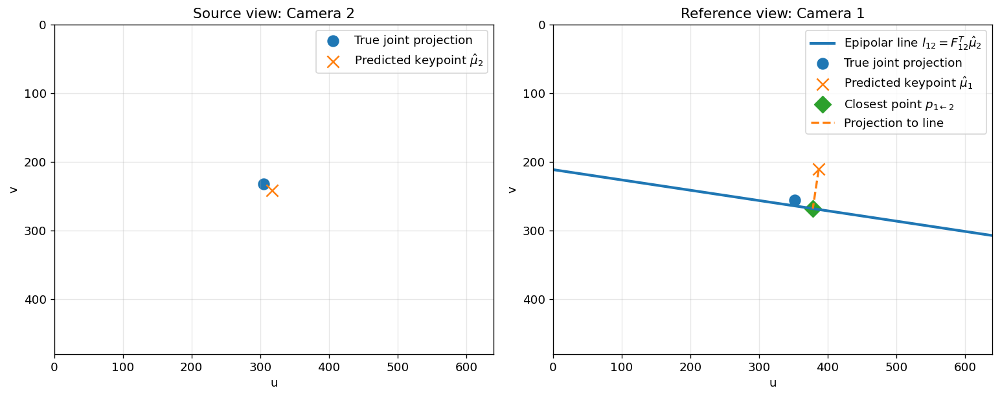

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Demo: Cross-view projection by fundamental matrix
# We visualize:
#   camera 2 predicted keypoint -> epipolar line in camera 1
#   camera 1 predicted keypoint -> closest point on that line
# ============================================================

# -----------------------------
# 1. Helper functions
# -----------------------------
def skew(t):
    """Return the skew-symmetric matrix [t]_x."""
    tx, ty, tz = t
    return np.array([
        [0, -tz, ty],
        [tz, 0, -tx],
        [-ty, tx, 0]
    ], dtype=float)

def rot_y(theta):
    """Rotation matrix around y-axis."""
    c, s = np.cos(theta), np.sin(theta)
    return np.array([
        [c, 0, s],
        [0, 1, 0],
        [-s, 0, c]
    ], dtype=float)

def project_point(K, R, t, X):
    """
    Project 3D point X into image.
    Camera model: x_cam = R X + t
    Projection:   x_img ~ K x_cam
    """
    X_cam = R @ X + t
    x_h = K @ X_cam
    x = x_h[:2] / x_h[2]
    return x

def closest_point_on_line(point, line):
    """
    Project a 2D point onto a line.
    line: a*u + b*v + c = 0
    point: [u0, v0]
    """
    a, b, c = line
    u0, v0 = point
    denom = a*a + b*b
    p_closest = point - (a*u0 + b*v0 + c) / denom * np.array([a, b])
    return p_closest

def line_segment_in_image(line, width, height):
    """
    Convert line a*u+b*v+c=0 into two visible endpoints inside image.
    """
    a, b, c = line
    pts = []

    # Intersections with u = 0 and u = width
    if abs(b) > 1e-9:
        for u in [0, width]:
            v = -(a*u + c) / b
            if 0 <= v <= height:
                pts.append([u, v])

    # Intersections with v = 0 and v = height
    if abs(a) > 1e-9:
        for v in [0, height]:
            u = -(b*v + c) / a
            if 0 <= u <= width:
                pts.append([u, v])

    # Remove duplicates
    unique_pts = []
    for p in pts:
        if not any(np.linalg.norm(np.array(p) - np.array(q)) < 1e-6 for q in unique_pts):
            unique_pts.append(p)

    if len(unique_pts) >= 2:
        return np.array(unique_pts[:2])

    return None

# -----------------------------
# 2. Define two calibrated cameras
# -----------------------------
W, H = 640, 480

K1 = np.array([
    [800, 0, W/2],
    [0, 800, H/2],
    [0, 0, 1]
], dtype=float)

K2 = K1.copy()

# Camera 1: world origin, looking along +Z
R1 = np.eye(3)
t1 = np.zeros(3)

# Camera 2: translated and slightly rotated
R2 = rot_y(np.deg2rad(8))
C2_world = np.array([1.0, 0.15, 0.0])   # camera center in world coordinates
t2 = -R2 @ C2_world                      # world-to-camera translation

# -----------------------------
# 3. Simulate one 3D joint point
# -----------------------------
X_world = np.array([0.20, 0.10, 5.0])    # one 3D joint, e.g. right wrist

# True projections in two views
x1_true = project_point(K1, R1, t1, X_world)
x2_true = project_point(K2, R2, t2, X_world)

# Simulated 2D pose-estimator predictions with noise
# These are analogous to \hat{\mu}_1 and \hat{\mu}_2 in the paper
mu1_pred = x1_true + np.array([35.0, -45.0])   # noisy prediction in reference view
mu2_pred = x2_true + np.array([12.0, 10.0])    # noisy prediction in source view

# Convert to homogeneous coordinates
mu1_h = np.array([mu1_pred[0], mu1_pred[1], 1.0])
mu2_h = np.array([mu2_pred[0], mu2_pred[1], 1.0])

x1_true_h = np.array([x1_true[0], x1_true[1], 1.0])
x2_true_h = np.array([x2_true[0], x2_true[1], 1.0])

# -----------------------------
# 4. Compute fundamental matrix
# -----------------------------
# For cameras:
#   Camera 1: P1 = K1 [I | 0]
#   Camera 2: P2 = K2 [R2 | t2]
#
# The epipolar constraint is:
#   x2^T F x1 = 0
#
# Therefore:
#   line in camera 1 induced by point x2 is l1 = F^T x2
E = skew(t2) @ R2
F = np.linalg.inv(K2).T @ E @ np.linalg.inv(K1)

# Epipolar line in camera 1 induced by camera-2 predicted point
l1_from_2 = F.T @ mu2_h
l1_from_2 = l1_from_2 / np.sqrt(l1_from_2[0]**2 + l1_from_2[1]**2)

# Closest point from camera-1 prediction to the epipolar line
p_1_from_2 = closest_point_on_line(mu1_pred, l1_from_2)

# Distance before and after projection
dist_before = abs(l1_from_2 @ mu1_h)
p_1_from_2_h = np.array([p_1_from_2[0], p_1_from_2[1], 1.0])
dist_after = abs(l1_from_2 @ p_1_from_2_h)

print("True point in camera 1:", x1_true)
print("Predicted point in camera 1, mu1_pred:", mu1_pred)
print("Predicted point in camera 2, mu2_pred:", mu2_pred)
print("Epipolar line in camera 1: a*u + b*v + c = 0")
print("line =", l1_from_2)
print("Distance from mu1_pred to epipolar line before projection:", dist_before)
print("Distance after projection:", dist_after)

# -----------------------------
# 5. Visualization
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# ---- View 2: source view ----
ax = axes[0]
ax.set_title("Source view: Camera 2")
ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_aspect("equal")
ax.set_xlabel("u")
ax.set_ylabel("v")
ax.grid(True, alpha=0.3)

ax.scatter(x2_true[0], x2_true[1], s=100, marker="o", label="True joint projection")
ax.scatter(mu2_pred[0], mu2_pred[1], s=120, marker="x", label=r"Predicted keypoint $\hat{\mu}_2$")
ax.legend(loc="upper right")

# ---- View 1: reference view ----
ax = axes[1]
ax.set_title("Reference view: Camera 1")
ax.set_xlim(0, W)
ax.set_ylim(H, 0)
ax.set_aspect("equal")
ax.set_xlabel("u")
ax.set_ylabel("v")
ax.grid(True, alpha=0.3)

# Draw epipolar line in camera 1
seg = line_segment_in_image(l1_from_2, W, H)
if seg is not None:
    ax.plot(seg[:, 0], seg[:, 1], linewidth=2.5, label=r"Epipolar line $l_{12}=F_{12}^T\hat{\mu}_2$")

# Draw true point, predicted point, and closest point
ax.scatter(x1_true[0], x1_true[1], s=100, marker="o", label="True joint projection")
ax.scatter(mu1_pred[0], mu1_pred[1], s=120, marker="x", label=r"Predicted keypoint $\hat{\mu}_1$")
ax.scatter(p_1_from_2[0], p_1_from_2[1], s=120, marker="D", label=r"Closest point $p_{1\leftarrow2}$")

# Draw projection segment from mu1_pred to closest point
ax.plot(
    [mu1_pred[0], p_1_from_2[0]],
    [mu1_pred[1], p_1_from_2[1]],
    linestyle="--",
    linewidth=2,
    label="Projection to line"
)

ax.legend(loc="upper right")
plt.tight_layout()
plt.show()

Step3:Pose Compiler - A deep learning block where the input is 2D point cloud and the output is a refined 2D keypoint $\hat{\mu}'_{i,k,t}$ and its uncertainty $\hat{\sigma}'_{i,k,t}$.(The pose compiler is trained with AMASS(Archive of Motion Capture As Surface Shapes, https://amass.is.tue.mpg.de/) , a large database of human motion unifying different optical marker-based motion capture datasets by representing them within a common framework and parameterization)
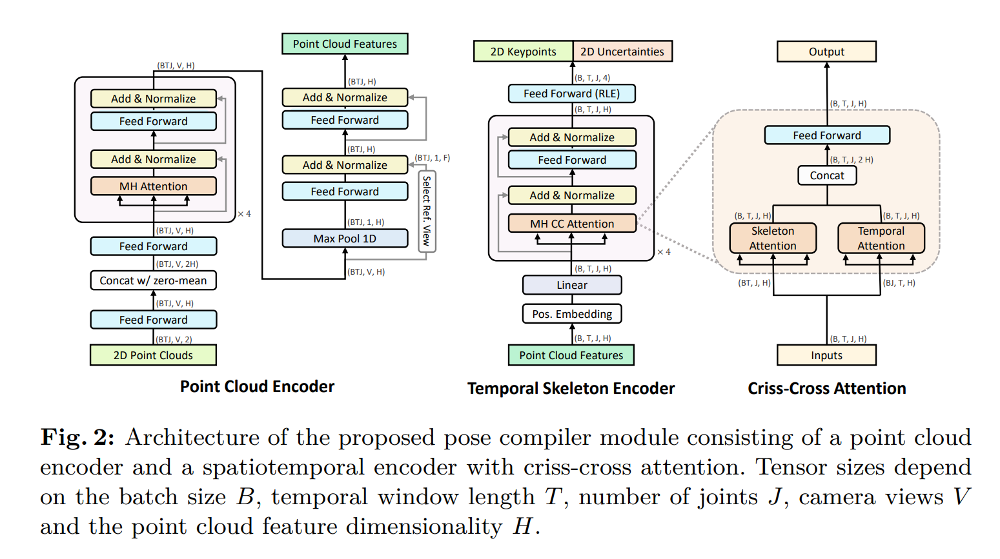


## Uncertainty-aware 3D Estimation

Step 4: Now we have the 2D joints' positions and uncertainty

4.1:Use the original 2D keypoints from Step 1 to initialize the 3D joint $U^\text{(0)}$ with DLT.
$$U^\text{(0)}=\mathrm{DLT}\left(\hat{\mu}_1,\ldots,\hat{\mu}_V\right)$$

4.2: The total loss function is：$$\mathcal{L}_{mle}=-\log \prod_{i\in\mathcal{V}} P_{\Theta}\left(u_i\mid\mathcal{I}\right)\bigg|_{u_i=\hat{\mu}_i}-\log \prod_{i\in\mathcal{V}} P_{\Theta'}\left(u_i\mid\mathcal{C}\right)\bigg|_{u_i=\hat{\mu}'_i}$$
Because the distribution is approximately Gaussian,the loss function can be written as:
$$\min_{U}\ \sum_{i}\frac{\left\|\pi_i(U)-\hat{\mu}_{i,k,t}\right\|^2}{\left(\hat{\sigma}_{i,k,t}\right)^2}
+\sum_{i}\frac{\left\|\pi_i(U)-\hat{\mu}'_{i,k,t}\right\|^2}{\left(\hat{\sigma}'_{i,k,t}\right)^2}
$$

This form can be viewed as an uncertainty-weighted reprojection refinement. This follows the idea of weighted DLT: predictions with lower uncertainty receive higher weights.

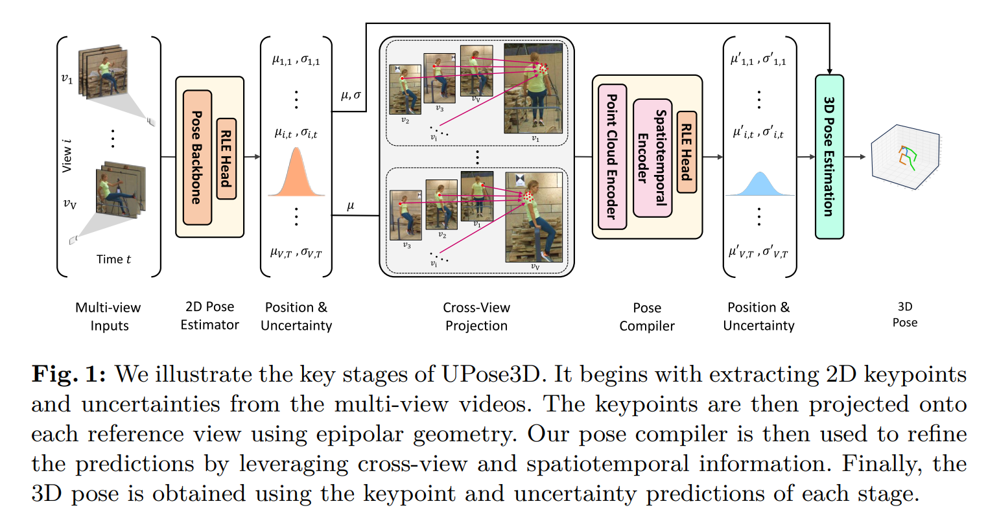
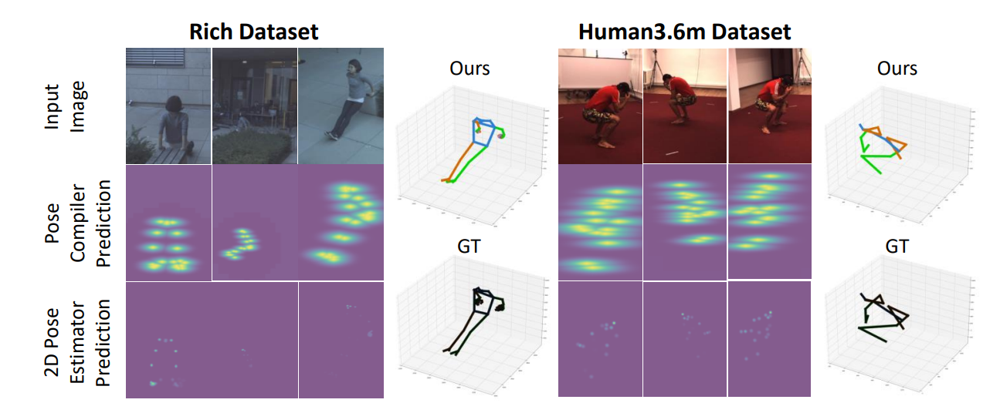

---
## 4. Nonlinear Method and Triangulation Application

---
### Definition: Triangulation Problem

Given 2D observations $\mathbf{p}_i$ in multiple cameras and their projection matrices $\mathbf{P}_i$, find 3D point $\mathbf{X}$ that:

$$\mathbf{p}_i = \mathbf{P}_i \mathbf{X} \quad \text{(up to scale)}$$

**Linear Method:** DLT (Direct Linear Transform)

Closed-form solution via SVD. For two cameras:

$$\begin{bmatrix} p_1 \mathbf{P}_1[3,:] - \mathbf{P}_1[1,:] \\ p_1 \mathbf{P}_1[3,:] - \mathbf{P}_1[2,:] \\ p_2 \mathbf{P}_2[3,:] - \mathbf{P}_2[1,:] \\ p_2 \mathbf{P}_2[3,:] - \mathbf{P}_2[2,:] \end{bmatrix} \mathbf{X} = \mathbf{0}$$

Solve using SVD: $\mathbf{A} = \mathbf{U}\mathbf{\Sigma}\mathbf{V}^T$, solution is last column of $\mathbf{V}$

**Nonlinear Method:** Levenberg-Marquardt

Minimize reprojection error:

$$\min_{\mathbf{X}} \sum_i \left\| \mathbf{p}_i - \pi(\mathbf{P}_i \mathbf{X}) \right\|^2$$





$$\min_{\mathbf{X}} \sum_i \left\| \mathbf{p}_i - \pi(\mathbf{P}_i \mathbf{X}) \right\|^2$$

where $\pi$ is the perspective projection (divide by $z$-coordinate).

**Meaning:**
Finding the 3D point $\mathbf{X}$ that minimizes the squared geometric distance between the **observed 2D points** $\mathbf{p}_i$ and the **reprojected points** $\pi(\mathbf{P}_i \mathbf{X})$ across all camera views.

**$\pi$ (Perspective Projection):**
The function $\pi$ transforms a homogeneous point $[x, y, z]^T$ into non-homogeneous image coordinates by dividing by the last component:
$$\pi\left( \begin{bmatrix} x \\ y \\ z \end{bmatrix} \right) = \begin{bmatrix} x/z \\ y/z \end{bmatrix}$$
This operation accounts for the perspective effect where objects further from the camera appear smaller.

### Linear Triangulation from Real Image

The full workflow is:

__1__.Load two calibrated images

__2__.Read camera matrices K, R, t
        
__3__.Construct projection matrices P0 and P1
        
__4__.Detect SIFT features
       
__5__.Match feature descriptors
       
__6__.Function: Apply Lowe's ratio test(ratio = 0.75)
       
__7__.Function: Estimate fundamental matrix with RANSAC
       
__8__.Function: Keep geometrically consistent inlier matches
        
__9__.__Triangulate 3D points using DLT__
        
__10__.Filter invalid points:
    - finite-value check
    - positive-depth check
    - reprojection-error check (RMSE < 5)


---

### Triangulation Code Demostration

**Dataset:** [SfM Camera trajectory quality evaluation](https://github.com/openMVG/SfM_quality_evaluation)

This notebook uses the `fountain-P11` dataset (Strecha et al., CVPR 2008). The set contains calibrated images of a fountain captured from many viewpoints for benchmarking multi-view stereo and camera calibration tasks.

Key details:
- Location in repo: `Benchmarking_Camera_Calibration_2008/fountain-P11/images`
- Filenames: sequential (for example `0000.jpg`, `0001.jpg`, ...)
- Intrinsics matrix: a shared `K.txt` is provided with the camera matrix used for all images in the set
- A rotation matrix $R$ and transition vector $t$ in the `.jpg.camera` file, corresponding to each picture
- Intended use: feature matching, relative pose estimation, triangulation and dense multi-view stereo benchmarking

Example:
```
  #K, row-major 3 x 3 intrinsic matrix
  2759.48 0 1520.69
  0 2764.16 1006.81
  0 0 1

  0 0 0 # 3 values:  radial distortion parameters, unused here

  #R 3 x 3 rotation matrix
  0.450927 -0.0945642 -0.887537
  -0.892535 -0.0401974 -0.449183
  0.00679989 0.994707 -0.102528

  #3 values:  t, translation vector
  -7.28137 -7.57667 0.204446   

  #image width and height
  3072 2048  
```

In [ ]:
import os
import urllib.request
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

np.set_printoptions(precision=4, suppress=True)


#### Load Images and Camera Configurations

In [ ]:
# Reproducibility for any randomized OpenCV internals.
cv2.setRNGSeed(0)

# Dataset and reconstruction settings.
DATASET_ROOT = Path("fountain_P11_two_view_demo")
IMAGE_IDS = ["0000", "0003"]

# Feature extraction is run on resized images for speed.
# The recovered keypoint coordinates are scaled back to the original image resolution.
FEATURE_MAX_WIDTH = 1600

# Matching and geometric filtering settings.
LOWE_RATIO = 0.8
RANSAC_REPROJ_THRESHOLD_PX = 5.0
RANSAC_CONFIDENCE = 0.999

# DLT post-filtering settings.
MAX_REPROJECTION_ERROR_PX = 5.0
MIN_POSITIVE_DEPTH = 1e-6

# Number of matches displayed in the match visualization.
MAX_MATCHES_TO_DRAW = 120

# Cell 2: Download the two Fountain-P11 images and camera files

BASE_URL = (
    "https://raw.githubusercontent.com/openMVG/SfM_quality_evaluation/master/"
    "Benchmarking_Camera_Calibration_2008/fountain-P11"
)

IMAGE_DIR = DATASET_ROOT / "images"
CAMERA_DIR = DATASET_ROOT / "gt_dense_cameras"
OUTPUT_DIR = DATASET_ROOT / "outputs"

In [ ]:
for d in [IMAGE_DIR, CAMERA_DIR, OUTPUT_DIR]:
    d.mkdir(parents=True, exist_ok=True)


def download_file(url, dst):
    """Download a file only if it does not already exist."""
    dst = Path(dst)
    if dst.exists() and dst.stat().st_size > 0:
        print(f"Already exists: {dst}")
        return
    print(f"Downloading: {url}")
    urllib.request.urlretrieve(url, dst)
    print(f"Saved to: {dst}")


for image_id in IMAGE_IDS:
    image_url = f"{BASE_URL}/images/{image_id}.jpg"
    camera_url = f"{BASE_URL}/gt_dense_cameras/{image_id}.jpg.camera"

    download_file(image_url, IMAGE_DIR / f"{image_id}.jpg")
    download_file(camera_url, CAMERA_DIR / f"{image_id}.jpg.camera")

print("Download step completed.")

#cell 3 :read images
def read_rgb_image(path):
    """Read an image with OpenCV and convert BGR to RGB."""
    bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Could not read image: {path}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    return rgb


def read_strecha_camera(path):
    """
    Parse a Fountain-P11 .camera file.

    The file layout is:
        9 values:  K, row-major 3 x 3 intrinsic matrix
        3 values:  radial distortion parameters, unused here
        9 values:  R, row-major 3 x 3 rotation matrix
        3 values:  t, translation vector in P = K [R | t]
        2 values:  image width and height

    Important:
        The last 3-vector before image size is treated as t, not camera center C.

        Projection matrix:
            P = K [R | t]

        Camera center:
            C = -R^T t
    """
    text = Path(path).read_text()
    values = np.fromstring(text, sep=" ").astype(float)

    if values.size != 26:
        raise ValueError(f"Expected 26 numeric values in {path}, got {values.size}")

    K = values[0:9].reshape(3, 3)
    distortion = values[9:12]
    R = values[12:21].reshape(3, 3)

    C = values[21:24].reshape(3, 1)
    t = -np.linalg.inv(R.T) @ C

    t = values[21:24].reshape(3, 1)
    C = -R.T @ t

    width, height = int(values[24]), int(values[25])

    P = K @ np.hstack([R, t])

    return {"K": K,"distortion": distortion,"R": R,"t": t,"C": C.reshape(3),"P": P,"width": width,"height": height,}


images = {}
cameras = {}

for image_id in IMAGE_IDS:
    images[image_id] = read_rgb_image(IMAGE_DIR / f"{image_id}.jpg")
    cameras[image_id] = read_strecha_camera(CAMERA_DIR / f"{image_id}.jpg.camera")

    h, w = images[image_id].shape[:2]
    print(f"Image {image_id}: loaded shape = {w} x {h}")
    print(f"Camera {image_id}: file size = {cameras[image_id]['width']} x {cameras[image_id]['height']}")
    print(f"Camera {image_id}: camera center C = {cameras[image_id]['C']}")
    print(f"Camera {image_id}: translation t = {cameras[image_id]['t'].reshape(3)}")
    print()



Already exists: fountain_P11_two_view_demo/images/0000.jpg
Already exists: fountain_P11_two_view_demo/gt_dense_cameras/0000.jpg.camera
Downloading: https://raw.githubusercontent.com/openMVG/SfM_quality_evaluation/master/Benchmarking_Camera_Calibration_2008/fountain-P11/images/0003.jpg
Saved to: fountain_P11_two_view_demo/images/0003.jpg
Downloading: https://raw.githubusercontent.com/openMVG/SfM_quality_evaluation/master/Benchmarking_Camera_Calibration_2008/fountain-P11/gt_dense_cameras/0003.jpg.camera
Saved to: fountain_P11_two_view_demo/gt_dense_cameras/0003.jpg.camera
Download step completed.
Image 0000: loaded shape = 3072 x 2048
Camera 0000: file size = 3072 x 2048
Camera 0000: camera center C = [-3.4805 -1.1965 -9.8448]
Camera 0000: translation t = [-7.2814 -7.5767  0.2044]

Image 0003: loaded shape = 3072 x 2048
Camera 0003: file size = 3072 x 2048
Camera 0003: camera center C = [  5.8485  -0.9988 -10.1165]
Camera 0003: translation t = [-10.8142  -4.537    0.1223]



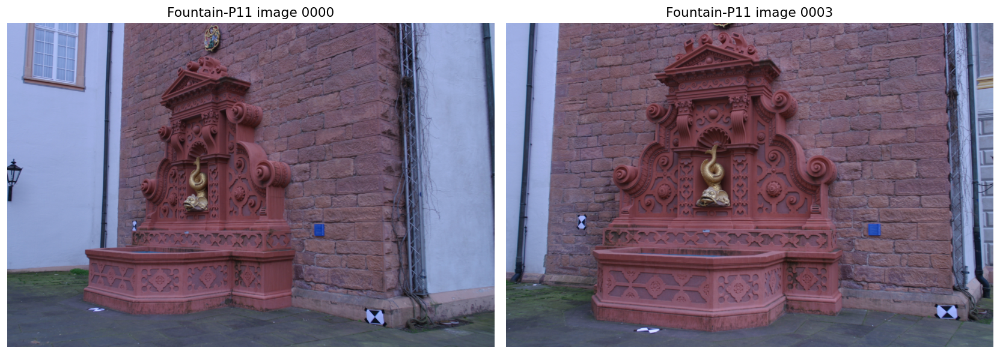

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, image_id in zip(axes, IMAGE_IDS):
    ax.imshow(images[image_id])
    ax.set_title(f"Fountain-P11 image {image_id}")
    ax.axis("off")

plt.tight_layout()
plt.show()

#### Detect local features and compute descriptors

In [ ]:
def resize_for_feature_detection(rgb, max_width=1600):
    """
    Resize an image for faster feature detection.

    Returns:
        resized_rgb: image used for feature extraction
        scale_to_original: multiply resized keypoint coordinates by this value
    """
    h, w = rgb.shape[:2]
    if w <= max_width:
        return rgb.copy(), 1.0

    scale = max_width / float(w)
    new_w = int(round(w * scale))
    new_h = int(round(h * scale))
    resized = cv2.resize(rgb, (new_w, new_h), interpolation=cv2.INTER_AREA)

    scale_to_original = 1.0 / scale
    return resized, scale_to_original


def create_feature_detector():
    """Create a SIFT detector when available; otherwise fall back to ORB."""
    if hasattr(cv2, "SIFT_create"):
        detector = cv2.SIFT_create(nfeatures=6000, contrastThreshold=0.02)
        method = "SIFT"
    else:
        detector = cv2.ORB_create(nfeatures=8000)
        method = "ORB"
    return detector, method


def detect_features(rgb, max_width=1600):
    """
    Detect features on a resized image, then convert keypoint coordinates
    back to the original full-resolution pixel coordinate system.
    """
    detector, method = create_feature_detector()

    resized_rgb, scale_to_original = resize_for_feature_detection(rgb, max_width=max_width)
    gray = cv2.cvtColor(resized_rgb, cv2.COLOR_RGB2GRAY)

    keypoints, descriptors = detector.detectAndCompute(gray, None)
    if descriptors is None or len(keypoints) == 0:
        raise RuntimeError("No descriptors were found. Try changing the feature detector settings.")

    xy_original = np.array(
        [[kp.pt[0] * scale_to_original, kp.pt[1] * scale_to_original] for kp in keypoints],
        dtype=np.float64,
    )

    return {
        "method": method,
        "resized_rgb": resized_rgb,
        "scale_to_original": scale_to_original,
        "keypoints": keypoints,
        "xy_original": xy_original,
        "descriptors": descriptors,
    }

features = {}

for image_id in IMAGE_IDS:
    features[image_id] = detect_features(images[image_id], max_width=FEATURE_MAX_WIDTH)
    print(
        f"Image {image_id}: detected {len(features[image_id]['keypoints'])} "
        f"{features[image_id]['method']} features"
    )

Image 0000: detected 6001 SIFT features
Image 0003: detected 6000 SIFT features


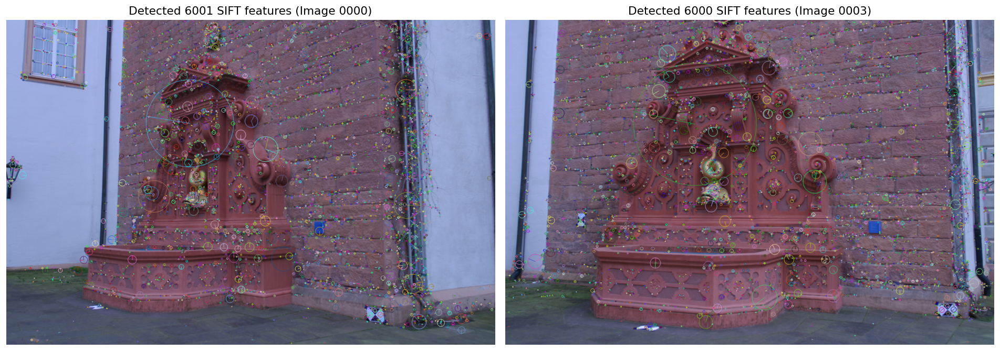

In [ ]:
def visualize_features(features_dict, image_ids):
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    for ax, img_id in zip(axes, image_ids):
        feat = features_dict[img_id]
        # Draw keypoints on the resized image used for detection
        img_with_features = cv2.drawKeypoints(
            feat['resized_rgb'],
            feat['keypoints'],
            None,
            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
        )

        ax.imshow(img_with_features)
        ax.set_title(f"Detected {len(feat['keypoints'])} {feat['method']} features (Image {img_id})")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

visualize_features(features, IMAGE_IDS)

#### Match features between features from two images and apply epipolar RANSAC

- Use a FLANN-based matcher (for SIFT) to find the nearest neighbors for each descriptor. It applies Lowe's ratio test, which only keeps a match if the closest neighbor is significantly closer than the second-closest, filtering out ambiguous matches.

- **Lowe’s ratio test** filters descriptor matches by keeping only those whose best match is much closer than the second-best match, reducing ambiguous correspondences.

- Use the matched pixel coordinates to estimate the Fundamental Matrix (F) using the RANSAC algorithm. RANSAC identifies a 'consensus set' of inlier matches that obey the epipolar geometry between the two views, while discarding outliers like mismatched textures or noise.

- **RANSAC** estimates the fundamental matrix while rejecting outlier matches, keeping only correspondences that are geometrically consistent.

In [ ]:
def match_descriptors(desc0, desc1, method, lowe_ratio=0.75):
    """Match descriptors with Lowe's ratio test."""
    if method == "SIFT":
        desc0 = desc0.astype(np.float32)
        desc1 = desc1.astype(np.float32)
        index_params = dict(algorithm=1, trees=5)  # FLANN KD-tree
        search_params = dict(checks=80)
        matcher = cv2.FlannBasedMatcher(index_params, search_params)
        raw_matches = matcher.knnMatch(desc0, desc1, k=2)
    else:
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
        raw_matches = matcher.knnMatch(desc0, desc1, k=2)

    good_matches = []
    for pair in raw_matches:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < lowe_ratio * n.distance:
            good_matches.append(m)

    return good_matches


id0, id1 = IMAGE_IDS
method0 = features[id0]["method"]
method1 = features[id1]["method"]

if method0 != method1:
    raise RuntimeError(f"Feature methods do not match: {method0} vs {method1}")

matches = match_descriptors(
    features[id0]["descriptors"],
    features[id1]["descriptors"],
    method=method0,
    lowe_ratio=LOWE_RATIO,
)

pts0 = np.array([features[id0]["xy_original"][m.queryIdx] for m in matches], dtype=np.float64)
pts1 = np.array([features[id1]["xy_original"][m.trainIdx] for m in matches], dtype=np.float64)

print(f"Putative matches after Lowe's ratio test: {len(matches)}")

F, inlier_mask = cv2.findFundamentalMat(
    pts0,
    pts1,
    method=cv2.FM_RANSAC,
    ransacReprojThreshold=RANSAC_REPROJ_THRESHOLD_PX,
    confidence=RANSAC_CONFIDENCE,
)

inlier_mask = inlier_mask.ravel().astype(bool)
pts0_in = pts0[inlier_mask]
pts1_in = pts1[inlier_mask]
matches_in = [m for m, keep in zip(matches, inlier_mask) if keep]

print(f"RANSAC inlier matches: {len(matches_in)}")
print("Estimated fundamental matrix:")
print(F)



Putative matches after Lowe's ratio test: 1135
RANSAC inlier matches: 950
Estimated fundamental matrix:
[[-0.      0.     -0.0002]
 [ 0.      0.      0.0019]
 [-0.0003 -0.0026  1.    ]]


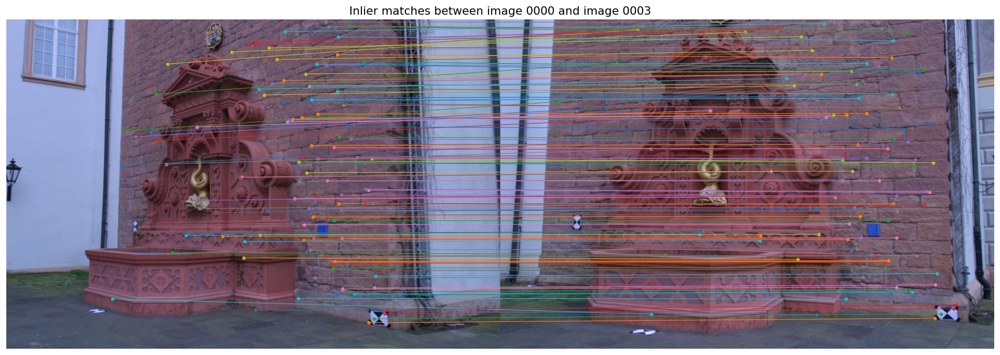

In [ ]:
# Visualize inlier matches

def show_matches_side_by_side(img0, img1, pts0, pts1, max_matches=120, title="Inlier feature matches"):
    """Draw a subset of feature matches between two images."""
    n = min(max_matches, len(pts0))
    if n == 0:
        raise RuntimeError("No matches to display.")

    idx = np.linspace(0, len(pts0) - 1, n).astype(int)

    h0, w0 = img0.shape[:2]
    h1, w1 = img1.shape[:2]

    display_width = 900
    scale0 = display_width / float(w0)
    scale1 = display_width / float(w1)

    disp0 = cv2.resize(img0, (display_width, int(round(h0 * scale0))), interpolation=cv2.INTER_AREA)
    disp1 = cv2.resize(img1, (display_width, int(round(h1 * scale1))), interpolation=cv2.INTER_AREA)

    H = max(disp0.shape[0], disp1.shape[0])
    canvas = np.zeros((H, disp0.shape[1] + disp1.shape[1], 3), dtype=np.uint8)
    canvas[: disp0.shape[0], : disp0.shape[1]] = disp0
    canvas[: disp1.shape[0], disp0.shape[1] :] = disp1

    plt.figure(figsize=(16, 7))
    plt.imshow(canvas)

    for i in idx:
        x0, y0 = pts0[i] * scale0
        x1, y1 = pts1[i] * scale1
        x1_shifted = x1 + disp0.shape[1]

        plt.plot([x0, x1_shifted], [y0, y1], linewidth=0.7)
        plt.scatter([x0, x1_shifted], [y0, y1], s=8)

    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


show_matches_side_by_side(
    images[id0],
    images[id1],
    pts0_in,
    pts1_in,
    max_matches=MAX_MATCHES_TO_DRAW,
    title=f"Inlier matches between image {id0} and image {id1}",
)

#### DLT triangulation from two calibrated views

In [ ]:
def triangulate_point_dlt(x0, x1, P0, P1):
    """
    Triangulate one 3D point from two 2D observations using linear DLT.

    Each observation gives two linear equations:
        u * p3^T X - p1^T X = 0
        v * p3^T X - p2^T X = 0

    The solution is the right singular vector corresponding to
    the smallest singular value of A.
    """
    u0, v0 = x0
    u1, v1 = x1

    A = np.vstack(
        [
            u0 * P0[2, :] - P0[0, :],
            v0 * P0[2, :] - P0[1, :],
            u1 * P1[2, :] - P1[0, :],
            v1 * P1[2, :] - P1[1, :],
        ]
    )

    _, s, Vt = np.linalg.svd(A)
    X_h = Vt[-1, :]

    if abs(X_h[3]) < 1e-12:
        return np.array([np.nan, np.nan, np.nan]), s[-1]

    X = X_h[:3] / X_h[3]
    return X, s[-1]


def triangulate_points_dlt(pts0, pts1, P0, P1):
    """Triangulate many matched points with DLT."""
    points_3d = []
    smallest_singular_values = []

    for x0, x1 in zip(pts0, pts1):
        X, sigma_min = triangulate_point_dlt(x0, x1, P0, P1)
        points_3d.append(X)
        smallest_singular_values.append(sigma_min)

    return np.asarray(points_3d), np.asarray(smallest_singular_values)


P0 = cameras[id0]["P"]
P1 = cameras[id1]["P"]

X_raw, sigma_min = triangulate_points_dlt(pts0_in, pts1_in, P0, P1)

print(f"Triangulated raw 3D points: {len(X_raw)}")



Triangulated raw 3D points: 950


#### Compute reprojection error and filter invalid reconstructed points

In [ ]:
def project_points(P, X):
    """Project 3D points into an image using a 3 x 4 projection matrix."""
    X_h = np.hstack([X, np.ones((len(X), 1))])
    x_h = (P @ X_h.T).T

    valid = np.abs(x_h[:, 2]) > 1e-12
    x = np.full((len(X), 2), np.nan, dtype=np.float64)
    x[valid] = x_h[valid, :2] / x_h[valid, 2:3]

    return x


def camera_depths(R, t, X):
    """Return the z-depth of world points in one camera coordinate system."""
    X_cam = (R @ X.T + t).T
    return X_cam[:, 2]


def sample_image_colors(rgb, pts):
    """Sample RGB colors from image pixels at given 2D coordinates."""
    h, w = rgb.shape[:2]
    xy = np.round(pts).astype(int)
    x = np.clip(xy[:, 0], 0, w - 1)
    y = np.clip(xy[:, 1], 0, h - 1)
    return rgb[y, x] / 255.0

x0_proj = project_points(P0, X_raw)
x1_proj = project_points(P1, X_raw)

err0 = np.linalg.norm(x0_proj - pts0_in, axis=1)
err1 = np.linalg.norm(x1_proj - pts1_in, axis=1)
mean_reproj_err = np.sqrt(0.5 * (err0**2 + err1**2))

depth0 = camera_depths(cameras[id0]["R"], cameras[id0]["t"], X_raw)
depth1 = camera_depths(cameras[id1]["R"], cameras[id1]["t"], X_raw)

finite_mask = np.all(np.isfinite(X_raw), axis=1)
positive_depth_mask = (depth0 > MIN_POSITIVE_DEPTH) & (depth1 > MIN_POSITIVE_DEPTH)
reproj_mask = mean_reproj_err < MAX_REPROJECTION_ERROR_PX

valid_mask = finite_mask & positive_depth_mask & reproj_mask

X_valid = X_raw[valid_mask]
pts0_valid = pts0_in[valid_mask]
pts1_valid = pts1_in[valid_mask]
err_valid = mean_reproj_err[valid_mask]
colors_valid = sample_image_colors(images[id0], pts0_valid)

print(f"Raw triangulated points: {len(X_raw)}")
print(f"Valid points after positive-depth and reprojection filtering: {len(X_valid)}")
print(f"Mean reprojection error before filtering: {np.nanmean(mean_reproj_err):.3f} px")
print(f"Median reprojection error before filtering: {np.nanmedian(mean_reproj_err):.3f} px")

if len(X_valid) > 0:
    print(f"Mean reprojection error after filtering: {np.mean(err_valid):.3f} px")
    print(f"Median reprojection error after filtering: {np.median(err_valid):.3f} px")

Raw triangulated points: 950
Valid points after positive-depth and reprojection filtering: 6
Mean reprojection error before filtering: 90.225 px
Median reprojection error before filtering: 84.044 px
Mean reprojection error after filtering: 3.483 px
Median reprojection error after filtering: 3.619 px


In [ ]:
# Remove extreme spatial outliers for cleaner visualization

def percentile_bbox_filter(X, lower_percentile=1.0, upper_percentile=99.0):
    """Keep points inside a percentile-based 3D bounding box."""
    lo = np.percentile(X, lower_percentile, axis=0)
    hi = np.percentile(X, upper_percentile, axis=0)
    mask = np.all((X >= lo) & (X <= hi), axis=1)
    return mask, lo, hi


bbox_mask, bbox_lo, bbox_hi = percentile_bbox_filter(X_valid, 1.0, 99.0)

X_plot = X_valid[bbox_mask]
colors_plot = colors_valid[bbox_mask]
err_plot = err_valid[bbox_mask]

print(f"Points kept for visualization: {len(X_plot)}")
print(f"Visualization bounding box min: {bbox_lo}")
print(f"Visualization bounding box max: {bbox_hi}")


Points kept for visualization: 2
Visualization bounding box min: [-13.3317  40.8014  -4.4758]
Visualization bounding box max: [ -4.8304 233.9751   1.7389]


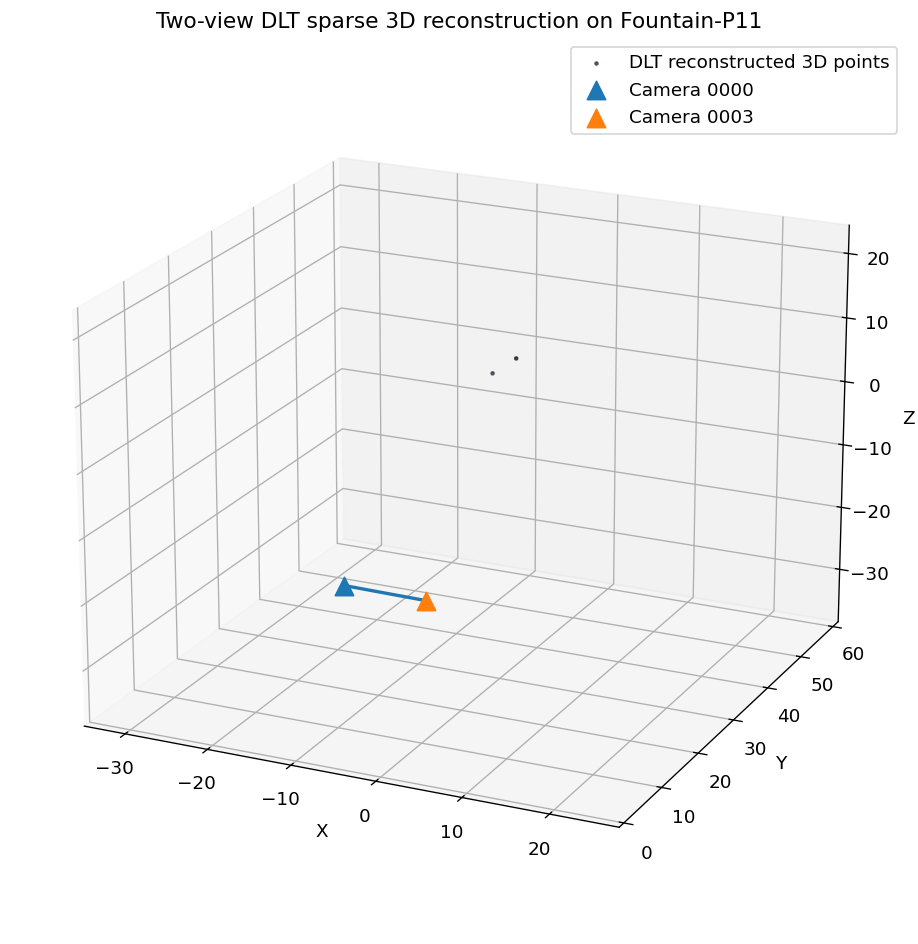

In [ ]:
# Visualize the reconstructed sparse 3D point cloud and camera centers

def set_axes_equal_3d(ax, X):
    """Set equal scale for all 3D axes in Matplotlib."""
    x_min, y_min, z_min = np.min(X, axis=0)
    x_max, y_max, z_max = np.max(X, axis=0)

    ranges = np.array([x_max - x_min, y_max - y_min, z_max - z_min])
    max_range = np.max(ranges)

    centers = np.array(
        [
            0.5 * (x_min + x_max),
            0.5 * (y_min + y_max),
            0.5 * (z_min + z_max),
        ]
    )

    ax.set_xlim(centers[0] - max_range / 2, centers[0] + max_range / 2)
    ax.set_ylim(centers[1] - max_range / 2, centers[1] + max_range / 2)
    ax.set_zlim(centers[2] - max_range / 2, centers[2] + max_range / 2)


C0 = cameras[id0]["C"]
C1 = cameras[id1]["C"]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

ax.scatter(
    X_plot[:, 0],
    X_plot[:, 1],
    X_plot[:, 2],
    s=3,
    c=colors_plot,
    alpha=0.85,
    label="DLT reconstructed 3D points",
)

ax.scatter(C0[0], C0[1], C0[2], s=120, marker="^", label=f"Camera {id0}")
ax.scatter(C1[0], C1[1], C1[2], s=120, marker="^", label=f"Camera {id1}")
ax.plot([C0[0], C1[0]], [C0[1], C1[1]], [C0[2], C1[2]], linewidth=2)

ax.set_title("Two-view DLT sparse 3D reconstruction on Fountain-P11")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.legend(loc="best")

set_axes_equal_3d(ax, np.vstack([X_plot, C0.reshape(1, 3), C1.reshape(1, 3)]))

# This view angle usually makes the sparse fountain structure easier to inspect.
ax.view_init(elev=20, azim=-65)

plt.tight_layout()
plt.show()

#### Visualize reprojection quality on both images (reproject 3D points back to 2D images)

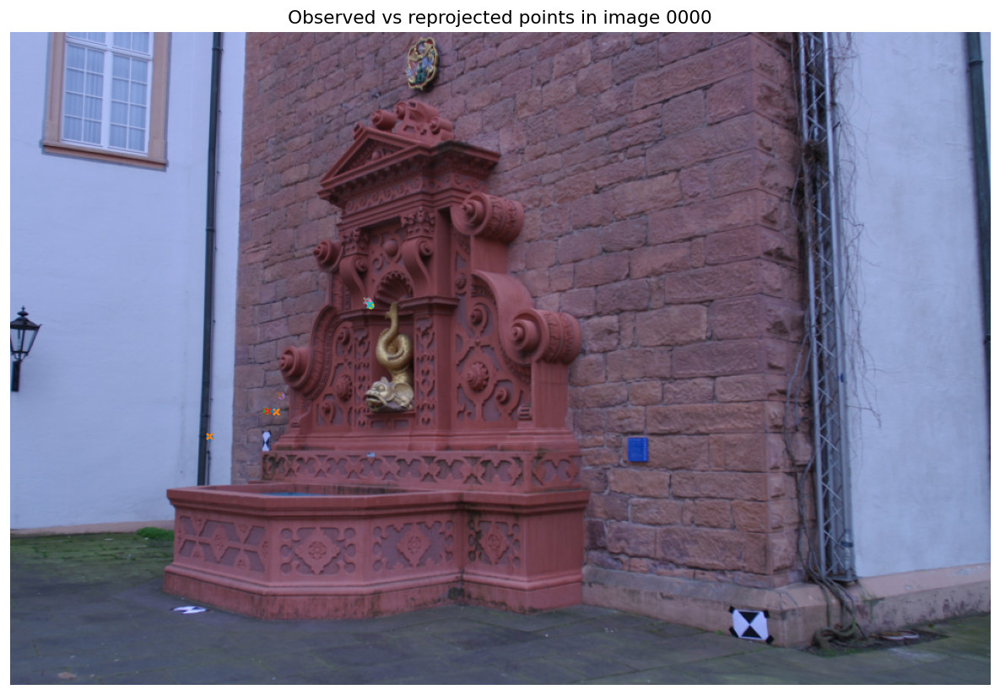

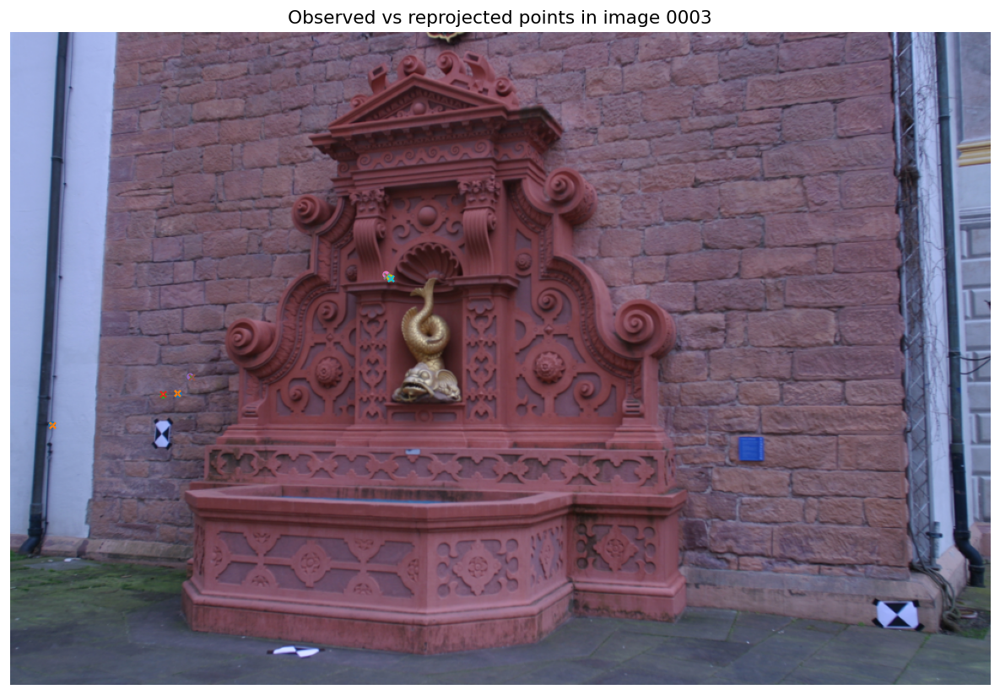

In [ ]:


def show_reprojection_overlay(rgb, observed_pts, projected_pts, title, max_points=250):
    """
    Show observed matched points and DLT reprojected points in one image.

    Circles indicate observed feature locations.
    Crosses indicate reprojected 3D points.
    Short line segments indicate reprojection residuals.
    """
    n = min(max_points, len(observed_pts))
    idx = np.linspace(0, len(observed_pts) - 1, n).astype(int)

    h, w = rgb.shape[:2]
    display_width = 1000
    scale = display_width / float(w)

    disp = cv2.resize(rgb, (display_width, int(round(h * scale))), interpolation=cv2.INTER_AREA)

    obs = observed_pts[idx] * scale
    prj = projected_pts[idx] * scale

    plt.figure(figsize=(12, 7))
    plt.imshow(disp)

    for p_obs, p_prj in zip(obs, prj):
        plt.plot([p_obs[0], p_prj[0]], [p_obs[1], p_prj[1]], linewidth=0.6)
        plt.scatter(p_obs[0], p_obs[1], s=16, marker="o")
        plt.scatter(p_prj[0], p_prj[1], s=18, marker="x")

    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


x0_proj_valid = project_points(P0, X_valid)
x1_proj_valid = project_points(P1, X_valid)

show_reprojection_overlay(
    images[id0],
    pts0_valid,
    x0_proj_valid,
    title=f"Observed vs reprojected points in image {id0}",
)

show_reprojection_overlay(
    images[id1],
    pts1_valid,
    x1_proj_valid,
    title=f"Observed vs reprojected points in image {id1}",
)


#### Interactive 3D scene visualization

In [ ]:

import plotly.graph_objects as go


def rgb_array_to_plotly_colors(colors):
    """
    Convert RGB colors to Plotly-compatible rgb strings.
    Input can be in [0, 1] or [0, 255].
    """
    colors = np.asarray(colors)

    if colors.max() <= 1.0:
        colors = colors * 255.0

    colors = np.clip(colors, 0, 255).astype(np.uint8)

    return [f"rgb({r},{g},{b})" for r, g, b in colors]


def make_camera_frustum(K, R, t, width, height, scale=0.4):
    """
    Create a camera frustum in world coordinates.

    The image corners are back-projected into camera coordinates,
    then transformed into world coordinates.
    """
    C = (-R.T @ t).reshape(3)

    image_corners = np.array([
        [0, 0, 1],
        [width, 0, 1],
        [width, height, 1],
        [0, height, 1],
    ], dtype=float).T

    rays_camera = np.linalg.inv(K) @ image_corners
    rays_camera = rays_camera / np.linalg.norm(rays_camera, axis=0, keepdims=True)

    corners_camera = scale * rays_camera
    corners_world = (R.T @ (corners_camera - t)).T

    return C, corners_world


def add_camera_to_figure(fig, camera, name, scale=0.4):
    """
    Add camera center and camera frustum to a Plotly 3D figure.
    """
    K = camera["K"]
    R = camera["R"]
    t = camera["t"]
    width = camera["width"]
    height = camera["height"]

    C, corners = make_camera_frustum(K, R, t, width, height, scale=scale)

    # Camera center.
    fig.add_trace(go.Scatter3d(
        x=[C[0]],
        y=[C[1]],
        z=[C[2]],
        mode="markers+text",
        marker=dict(size=6),
        text=[name],
        textposition="top center",
        name=name,
    ))

    # Frustum edges.
    edge_pairs = [
        (0, 1), (1, 2), (2, 3), (3, 0),
        (-1, 0), (-1, 1), (-1, 2), (-1, 3),
    ]

    points = np.vstack([C.reshape(1, 3), corners])

    for a, b in edge_pairs:
        ia = 0 if a == -1 else a + 1
        ib = 0 if b == -1 else b + 1

        fig.add_trace(go.Scatter3d(
            x=[points[ia, 0], points[ib, 0]],
            y=[points[ia, 1], points[ib, 1]],
            z=[points[ia, 2], points[ib, 2]],
            mode="lines",
            line=dict(width=4),
            showlegend=False,
        ))



In [ ]:

# Use the final filtered DLT points.
points_scene = X_plot.copy()
colors_scene = colors_plot.copy()

# Optional: randomly downsample if there are too many points.
MAX_POINTS_TO_DISPLAY = 8000

if len(points_scene) > MAX_POINTS_TO_DISPLAY:
    rng = np.random.default_rng(0)
    idx = rng.choice(len(points_scene), size=MAX_POINTS_TO_DISPLAY, replace=False)
    points_scene = points_scene[idx]
    colors_scene = colors_scene[idx]

plotly_colors = rgb_array_to_plotly_colors(colors_scene)

fig = go.Figure()

# Add reconstructed 3D points.
fig.add_trace(go.Scatter3d(
    x=points_scene[:, 0],
    y=points_scene[:, 1],
    z=points_scene[:, 2],
    mode="markers",
    marker=dict(
        size=2,
        color=plotly_colors,
        opacity=0.9,
    ),
    name="DLT reconstructed sparse 3D points",
))

# Add cameras and frustums.
add_camera_to_figure(fig, cameras[id0], f"Camera {id0}", scale=0.5)
add_camera_to_figure(fig, cameras[id1], f"Camera {id1}", scale=0.5)

# Set a reasonable 3D layout.
fig.update_layout(
    title="Interactive two-view DLT 3D reconstruction scene",
    width=950,
    height=750,
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z",
        aspectmode="data",
    ),
    margin=dict(l=0, r=0, t=40, b=0),
)

fig.show()

#### Nonlinear method and comparison with linear DLT

In [ ]:
def refine_point_nonlinear(X_init, P0, P1, x0_obs, x1_obs):
    """
    Refine one 3D point by minimizing nonlinear reprojection error.
    The initial point comes from linear DLT.
    """
    result = least_squares(
        reprojection_residual_single,
        x0=X_init,
        args=(P0, P1, x0_obs, x1_obs),
        method="trf",
        loss="linear",
        max_nfev=100,
        xtol=1e-10,
        ftol=1e-10,
        gtol=1e-10,
    )

    return result.x, result.cost, result.success

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import least_squares

# ------------------------------------------------------------
# 1. Helper functions
# ------------------------------------------------------------

def project_single_point(P, X):
    """
    Project one 3D point X = [X, Y, Z] into an image using projection matrix P.
    Return 2D pixel coordinate [u, v].
    """
    X_h = np.array([X[0], X[1], X[2], 1.0], dtype=float)
    x_h = P @ X_h

    if abs(x_h[2]) < 1e-12:
        return np.array([np.nan, np.nan])

    return x_h[:2] / x_h[2]


def reprojection_residual_single(X, P0, P1, x0_obs, x1_obs):
    """
    Residual vector for nonlinear triangulation.

    We minimize:
        [u0_proj - u0_obs,
         v0_proj - v0_obs,
         u1_proj - u1_obs,
         v1_proj - v1_obs]
    """
    x0_proj = project_single_point(P0, X)
    x1_proj = project_single_point(P1, X)

    if not np.all(np.isfinite(x0_proj)) or not np.all(np.isfinite(x1_proj)):
        return np.array([1e6, 1e6, 1e6, 1e6])

    return np.hstack([
        x0_proj - x0_obs,
        x1_proj - x1_obs,
    ])





def compute_reprojection_rmse_per_point(P0, P1, X, pts0, pts1):
    """
    Compute per-point reprojection RMSE across two views.

    For each point:
        err0 = ||project(P0, X) - x0||
        err1 = ||project(P1, X) - x1||

        RMSE_i = sqrt((err0^2 + err1^2) / 2)
    """
    x0_proj = project_points(P0, X)
    x1_proj = project_points(P1, X)

    err0 = np.linalg.norm(x0_proj - pts0, axis=1)
    err1 = np.linalg.norm(x1_proj - pts1, axis=1)

    rmse_per_point = np.sqrt(0.5 * (err0**2 + err1**2))
    return rmse_per_point, err0, err1


def camera_depths_for_points(R, t, X):
    """
    Compute depth of 3D points in a camera coordinate system.
    """
    X_cam = (R @ X.T + t).T
    return X_cam[:, 2]


def summarize_method(name, X, rmse_per_point):
    """
    Print summary metrics for a reconstruction method.
    """
    print(f"\n{name}")
    print("-" * len(name))
    print(f"Number of 3D points              : {len(X)}")
    print(f"Overall reprojection RMSE         : {np.sqrt(np.mean(rmse_per_point**2)):.6f} px")
    print(f"Mean per-point reprojection RMSE  : {np.mean(rmse_per_point):.6f} px")
    print(f"Median per-point reprojection RMSE: {np.median(rmse_per_point):.6f} px")
    print(f"Max per-point reprojection RMSE   : {np.max(rmse_per_point):.6f} px")

# ------------------------------------------------------------
# 6. Visualization: Linear vs Nonlinear 3D point clouds
# ------------------------------------------------------------

def set_axes_equal_if_available(ax, X_all):
    """
    Make 3D axes approximately equal.
    """
    if len(X_all) == 0:
        return

    xyz_min = np.min(X_all, axis=0)
    xyz_max = np.max(X_all, axis=0)
    center = 0.5 * (xyz_min + xyz_max)
    radius = 0.5 * np.max(xyz_max - xyz_min)

    ax.set_xlim(center[0] - radius, center[0] + radius)
    ax.set_ylim(center[1] - radius, center[1] + radius)
    ax.set_zlim(center[2] - radius, center[2] + radius)



def plot_comparison():
    # ------------------------------------------------------------
    # 2. Inputs from the existing linear DLT pipeline
    # ------------------------------------------------------------

    P0 = cameras[id0]["P"]
    P1 = cameras[id1]["P"]

    R0 = cameras[id0]["R"]
    t0 = cameras[id0]["t"]

    R1 = cameras[id1]["R"]
    t1 = cameras[id1]["t"]

    # Linear DLT valid results from the previous cell.
    X_linear = X_valid.copy()
    pts0_linear = pts0_valid.copy()
    pts1_linear = pts1_valid.copy()

    print(f"Starting nonlinear refinement from {len(X_linear)} linear DLT points...")


    # ------------------------------------------------------------
    # 3. Nonlinear triangulation refinement
    # ------------------------------------------------------------

    X_nonlinear_list = []
    success_list = []
    cost_list = []

    for X_init, x0_obs, x1_obs in zip(X_linear, pts0_linear, pts1_linear):
        X_refined, cost, success = refine_point_nonlinear(
            X_init,
            P0,
            P1,
            x0_obs,
            x1_obs,
        )

        X_nonlinear_list.append(X_refined)
        cost_list.append(cost)
        success_list.append(success)

    X_nonlinear_raw = np.asarray(X_nonlinear_list)
    success_mask = np.asarray(success_list, dtype=bool)


    # ------------------------------------------------------------
    # 4. Filter nonlinear results using the same validity logic
    # ------------------------------------------------------------

    finite_mask_nl = np.all(np.isfinite(X_nonlinear_raw), axis=1)

    depth0_nl = camera_depths_for_points(R0, t0, X_nonlinear_raw)
    depth1_nl = camera_depths_for_points(R1, t1, X_nonlinear_raw)

    positive_depth_mask_nl = (
        (depth0_nl > MIN_POSITIVE_DEPTH)
        &
        (depth1_nl > MIN_POSITIVE_DEPTH)
    )

    rmse_nl_raw, _, _ = compute_reprojection_rmse_per_point(
        P0,
        P1,
        X_nonlinear_raw,
        pts0_linear,
        pts1_linear,
    )

    reproj_mask_nl = rmse_nl_raw < MAX_REPROJECTION_ERROR_PX

    valid_mask_nl = (
        success_mask
        &
        finite_mask_nl
        &
        positive_depth_mask_nl
        &
        reproj_mask_nl
    )

    X_nonlinear = X_nonlinear_raw[valid_mask_nl]
    pts0_nonlinear = pts0_linear[valid_mask_nl]
    pts1_nonlinear = pts1_linear[valid_mask_nl]
    colors_nonlinear = colors_valid[valid_mask_nl]

    # For fair comparison, compare linear and nonlinear results on the same surviving point set.
    X_linear_common = X_linear[valid_mask_nl]
    pts0_common = pts0_linear[valid_mask_nl]
    pts1_common = pts1_linear[valid_mask_nl]
    colors_common = colors_valid[valid_mask_nl]


    # ------------------------------------------------------------
    # 5. Compute metrics for linear and nonlinear methods
    # ------------------------------------------------------------

    rmse_linear_common, err0_linear, err1_linear = compute_reprojection_rmse_per_point(
        P0,
        P1,
        X_linear_common,
        pts0_common,
        pts1_common,
    )

    rmse_nonlinear, err0_nl, err1_nl = compute_reprojection_rmse_per_point(
        P0,
        P1,
        X_nonlinear,
        pts0_nonlinear,
        pts1_nonlinear,
    )

    print("\nNonlinear refinement status")
    print("---------------------------")
    print(f"Optimization success count       : {np.sum(success_mask)} / {len(success_mask)}")
    print(f"Valid nonlinear points after filter: {len(X_nonlinear)} / {len(X_nonlinear_raw)}")

    summarize_method("Linear DLT on common valid points", X_linear_common, rmse_linear_common)
    summarize_method("Nonlinear refinement on common valid points", X_nonlinear, rmse_nonlinear)

    if len(rmse_nonlinear) > 0:
        improvement = (
            np.sqrt(np.mean(rmse_linear_common**2))
            -
            np.sqrt(np.mean(rmse_nonlinear**2))
        )

        improvement_percent = 100.0 * improvement / np.sqrt(np.mean(rmse_linear_common**2))

        print("\nImprovement")
        print("-----------")
        print(f"Overall RMSE reduction: {improvement:.6f} px")
        print(f"Relative improvement  : {improvement_percent:.3f} %")

    if len(X_nonlinear) > 0:
        X_stack_for_bbox = np.vstack([X_linear_common, X_nonlinear])
        lo = np.percentile(X_stack_for_bbox, 1.0, axis=0)
        hi = np.percentile(X_stack_for_bbox, 99.0, axis=0)

        plot_mask = np.all((X_linear_common >= lo) & (X_linear_common <= hi), axis=1)
        plot_mask &= np.all((X_nonlinear >= lo) & (X_nonlinear <= hi), axis=1)

        X_linear_plot = X_linear_common[plot_mask]
        X_nonlinear_plot = X_nonlinear[plot_mask]
        colors_plot = colors_common[plot_mask]
    else:
        X_linear_plot = X_linear_common
        X_nonlinear_plot = X_nonlinear
        colors_plot = colors_common


    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax1.scatter(
        X_linear_plot[:, 0],
        X_linear_plot[:, 1],
        X_linear_plot[:, 2],
        c=colors_plot,
        s=12,
        depthshade=False,
    )
    ax1.scatter(
        cameras[id0]["C"][0],
        cameras[id0]["C"][1],
        cameras[id0]["C"][2],
        marker="^",
        s=80,
        label=f"Camera {id0}",
    )
    ax1.scatter(
        cameras[id1]["C"][0],
        cameras[id1]["C"][1],
        cameras[id1]["C"][2],
        marker="^",
        s=80,
        label=f"Camera {id1}",
    )
    ax1.set_title("Linear DLT 3D Points")
    ax1.set_xlabel("X")
    ax1.set_ylabel("Y")
    ax1.set_zlabel("Z")
    ax1.legend()
    set_axes_equal_if_available(ax1, np.vstack([X_linear_plot, cameras[id0]["C"], cameras[id1]["C"]]))

    ax2 = fig.add_subplot(1, 2, 2, projection="3d")
    ax2.scatter(
        X_nonlinear_plot[:, 0],
        X_nonlinear_plot[:, 1],
        X_nonlinear_plot[:, 2],
        c=colors_plot,
        s=12,
        depthshade=False,
    )
    ax2.scatter(
        cameras[id0]["C"][0],
        cameras[id0]["C"][1],
        cameras[id0]["C"][2],
        marker="^",
        s=80,
        label=f"Camera {id0}",
    )
    ax2.scatter(
        cameras[id1]["C"][0],
        cameras[id1]["C"][1],
        cameras[id1]["C"][2],
        marker="^",
        s=80,
        label=f"Camera {id1}",
    )
    ax2.set_title("Nonlinear Refined 3D Points")
    ax2.set_xlabel("X")
    ax2.set_ylabel("Y")
    ax2.set_zlabel("Z")
    ax2.legend()
    set_axes_equal_if_available(ax2, np.vstack([X_nonlinear_plot, cameras[id0]["C"], cameras[id1]["C"]]))

    plt.tight_layout()
    plt.show()


    # ------------------------------------------------------------
    # 7. Visualization: Reprojection RMSE comparison
    # ------------------------------------------------------------

    # Mean RMSE for the two methods
    mean_rmse_linear = np.mean(rmse_linear_common)
    mean_rmse_nonlinear = np.mean(rmse_nonlinear)

    methods = ["linear", "non-linear"]
    mean_rmse_values = [mean_rmse_linear, mean_rmse_nonlinear]

    plt.figure(figsize=(7, 5))
    bars = plt.bar(methods, mean_rmse_values)

    plt.ylabel("Mean RMSE [px]")
    plt.xlabel("Method")
    plt.title("Mean RMSE Comparison: Linear vs Non-linear")
    plt.grid(True, axis="y", alpha=0.3)

    # Show exact values on top of bars
    for bar, value in zip(bars, mean_rmse_values):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f"{value:.4f}",
            ha="center",
            va="bottom",
            fontsize=11,
        )

    plt.show()


    # ------------------------------------------------------------
    # 8. Compact metric table
    # ------------------------------------------------------------

    comparison_rows = [
        [
            "Linear DLT",
            len(X_linear_common),
            np.sqrt(np.mean(rmse_linear_common**2)),
            np.mean(rmse_linear_common),
            np.median(rmse_linear_common),
            np.max(rmse_linear_common),
        ],
        [
            "Nonlinear refinement",
            len(X_nonlinear),
            np.sqrt(np.mean(rmse_nonlinear**2)),
            np.mean(rmse_nonlinear),
            np.median(rmse_nonlinear),
            np.max(rmse_nonlinear),
        ],
    ]

    print("\nMetric comparison")
    print("-----------------")
    print(
        f"{'Method':<24} "
        f"{'N':>6} "
        # f"{'Overall RMSE(px)':>18} "
        f"{'Mean RMSE(px)':>16} "
        f"{'Median RMSE(px)':>18} "
        f"{'Max RMSE(px)':>14}"
    )

    for row in comparison_rows:
        print(
            f"{row[0]:<24} "
            f"{row[1]:>6d} "
            # f"{row[2]:>18.6f} "
            f"{row[3]:>16.6f} "
            f"{row[4]:>18.6f} "
            f"{row[5]:>14.6f}"
        )

Starting nonlinear refinement from 6 linear DLT points...

Nonlinear refinement status
---------------------------
Optimization success count       : 6 / 6
Valid nonlinear points after filter: 6 / 6

Linear DLT on common valid points
---------------------------------
Number of 3D points              : 6
Overall reprojection RMSE         : 3.713184 px
Mean per-point reprojection RMSE  : 3.482749 px
Median per-point reprojection RMSE: 3.618900 px
Max per-point reprojection RMSE   : 4.759200 px

Nonlinear refinement on common valid points
-------------------------------------------
Number of 3D points              : 6
Overall reprojection RMSE         : 3.713180 px
Mean per-point reprojection RMSE  : 3.482745 px
Median per-point reprojection RMSE: 3.618896 px
Max per-point reprojection RMSE   : 4.759194 px

Improvement
-----------
Overall RMSE reduction: 0.000004 px
Relative improvement  : 0.000 %


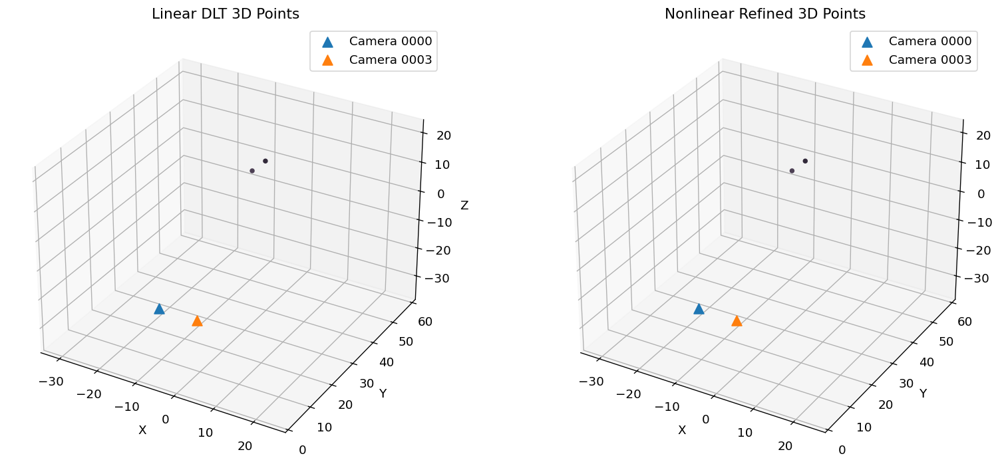

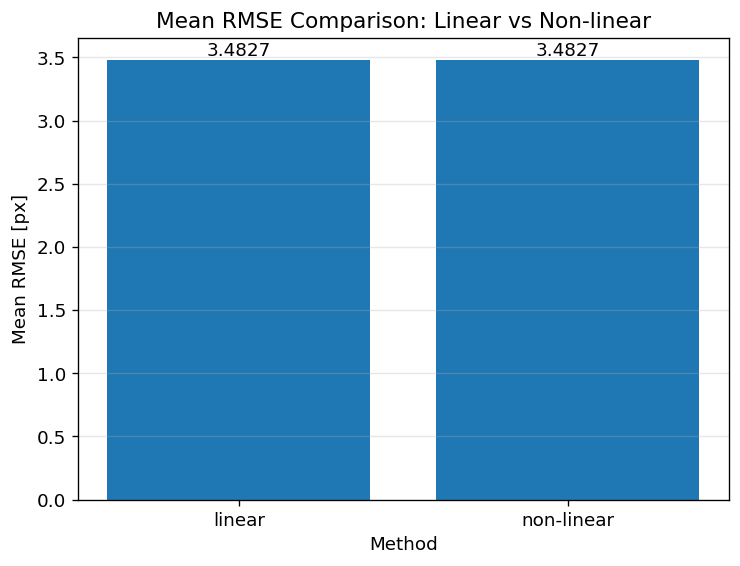


Metric comparison
-----------------
Method                        N    Mean RMSE(px)    Median RMSE(px)   Max RMSE(px)
Linear DLT                    6         3.482749           3.618900       4.759200
Nonlinear refinement          6         3.482745           3.618896       4.759194


In [ ]:
plot_comparison()

---
## 5. Conclusion of classical method

# Triangulation Methods: Mathematical Foundation

| Dimension | Line of Sight | Linear (Direct Linear Transform ) | Nonlinear (Levenberg–Marquardt) |
|-----------|---------------|--------------|----------------|
| **Core Math** | 3D geometric intersection | Solve $AP=0$ (SVD) | Minimize $\sum \|M_i P - p_i\|^2$ |
| **Error Function** | None | Algebraic $\|AP\|^2$ | Reprojection error |
| **Solution Type** | Geometric | Closed-form (SVD) | Iterative (LM) |
| **Optimality** | No | Algebraically optimal | MLE under Gaussian noise |

# Triangulation Methods: Practical Properties

| Dimension | Line of Sight | Linear (DLT) | Nonlinear (LM) |
|-----------|---------------|--------------|----------------|
| **Multi-view Support** | ✗ Difficult | ✓ Natural | ✓ Natural |
| **Noise Robustness** | ✗ Very poor | △ Moderate | ✓ Best |
| **Speed** | Fastest | Fast | Slow |
| **Needs Initial Guess** | No | No | Yes (from DLT) |
| **Robust Loss Compatible** | No | No | Yes |
| **Practical Role** | Teaching | Initialization | Final refinement |





#6. Beyond Classical Triangulation: Two Modern Directions

## Direction 1 — Transformer-based End-to-End Reconstruction
Recent works replace the entire classical pipeline with a single Transformer.

**Advantages:**
- **No explicit triangulation needed** — directly regresses 3D pointmaps from raw images
- **No camera calibration required** — handles uncalibrated, unposed images
- **Global reasoning via attention** — jointly reasons over all views, robust to extreme viewpoint changes
- **Feed-forward inference** — seconds per scene (vs. minutes for classical SfM + BA)

**Trade-offs:** black-box, data-hungry, limited geometric guarantees.

## Direction 2 — Classical Geometry
**Triangulation is not dead.** It remains:
- **Interpretable** — every step has clear geometric meaning
- **Generalizable** — works without massive training data
- **Composable** — extends naturally from points → lines → planes





## Today's Paper: *Consistent 3D Line Mapping* (ECCV 2024, which is CLMAP)
For each 2D line, you take the top K candidate matches in nearby images. Each match gives you one or more 3D line guesses, which the paper calls proposals. Then you score these proposals, pick the best one, group them into tracks, and run an optimizer at the end. LIMAP from CVPR 2023 is the strongest method in this family.

CLMAP pushes classical triangulation further by fixing **three inconsistency issues** from another paper "3D Line Mapping Revisited"(CVPR 2023, which is LIMAP)

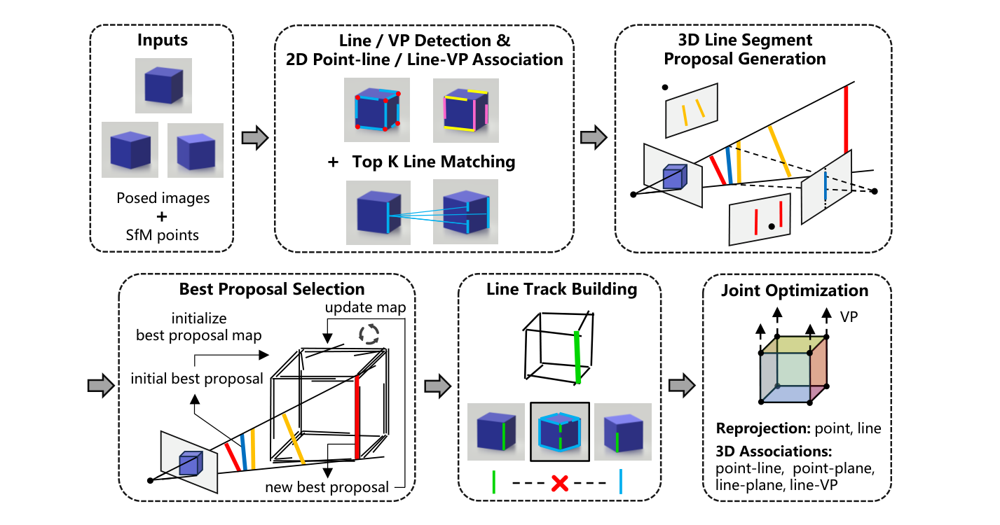






## Inconsistency 1 — Support Relationships
**The contradiction:**
- Step A assumes: "2D line $l_{pq}$ supports the 3D proposal $L^k_{ij}$"
- Step B independently decides: "The best 3D proposal for $l_{pq}$ is $\hat{L}_{pq}$"
- **But $L^k_{ij}$ and $\hat{L}_{pq}$ are not collinear!**

**Why it happens:** Best proposals are selected **independently** for each 2D line — no cross-checking.
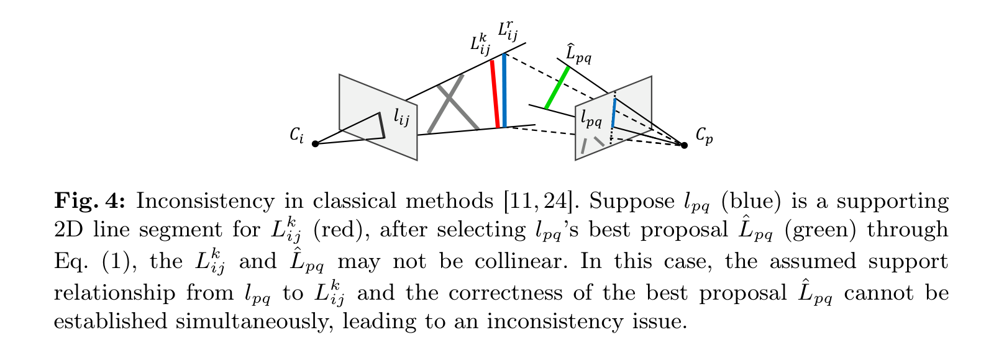

# Fix 1 — Iterative Best Proposal Selection

## The Problem (recap)
Each 2D line independently picks its best 3D proposal → support relationships contradict each other.

## The Fix: Score using the previous iteration's best proposals

**Classical (LIMAP):** Score each proposal independently using *any* matched proposal:
$$\hat{k} = \arg\max_k \sum_{p} \max_q \max_r \, s(L^k_{ij}, L^r_{ij})$$

**Theirs:** Score using the **previous iteration's best proposal** $\hat{L}^{(m-1)}_{pq}$ of each matched line:
$$\hat{k}^{(m)} = \arg\max_k \sum_{p} \max_q \, s(L^k_{ij}, \hat{L}^{(m-1)}_{pq})$$

## Iteration loop
1. **Initialize** with classical method (Eq. 1)
2. **Re-score** each proposal against its neighbors' previous best
3. **Update** the best proposal map
4. **Stop** when fewer than $t_c = 30\%$ of lines change their best proposal

CP（Consistency Percentage）
R（Length Recall）
P（Inlier Percentage）
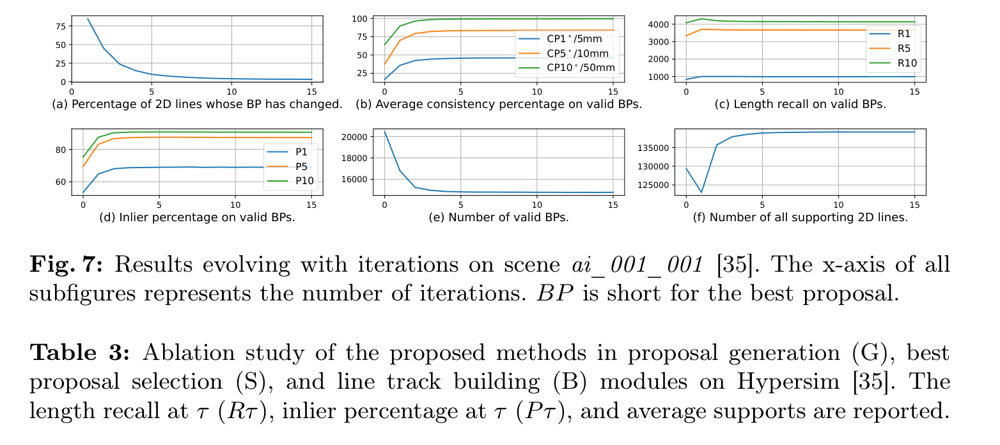

## Inconsistency 2 — Line Track Elements
**The contradiction:**
- A line track is *defined* as 2D segments observing the **same** 3D line
- But classical methods may group **two non-collinear 2D segments on the same image** into one track
- A single 3D line projects to **one** 2D line per image — not two

**Why it happens:** Clustering uses 3D similarity but ignores 2D collinearity constraints.
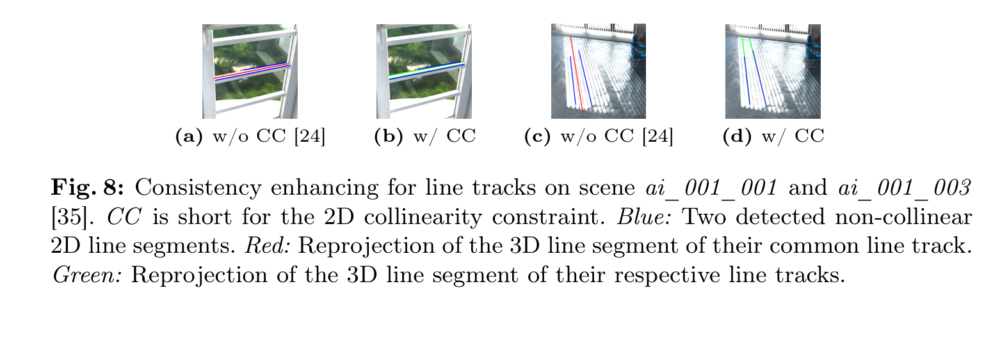

# Fix 2 — Collinearity-Aware Line Track Building

## The Problem (recap)
Classical clustering may group two non-collinear 2D segments on the same image into one track.

## The Fix: Add 2D collinearity check before merging

When merging two groups $G_1, G_2$, **reject the merge** if any pair $l_1 \in G_1, l_2 \in G_2$ satisfies:
- $l_1, l_2$ are on the **same image**, AND
- $d_a(l_1, l_2) > 2°$ (angle), OR
- $d_p(l_1, l_2) > 2$ pixels (perpendicular distance), OR
- $d_o(l_1, l_2) > 0$ (overlap ratio)

→ Enforces the definition: one 3D line projects to **one** 2D segment per image.



## Inconsistency 3 — Line Map Structure
**The contradiction:**
- Real scenes have **structural regularities**: lines lie on planes, parallel lines share vanishing points
- Classical optimization only enforces per-line reprojection error
- Reconstructed lines float near planes instead of *on* them

**Why it happens:** LIMAP doesn't model coplanarity constraints.
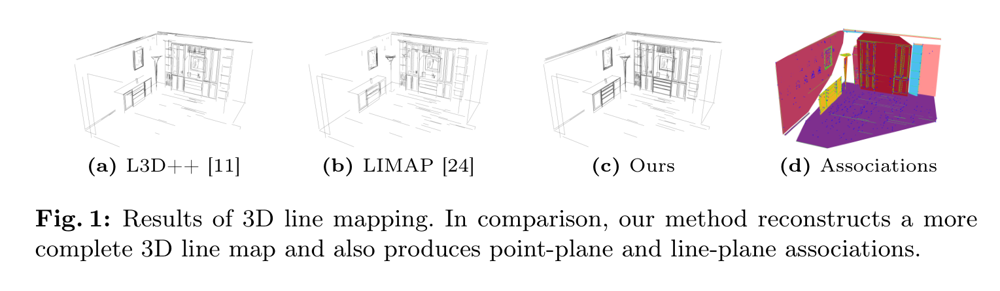

# Fix 3 — Joint Optimization with Coplanarity

## The Problem (recap)
Classical Bundle Adjustment doesn't enforce that lines lie on planes → reconstructed structure contradicts reality.

## The Fix: Joint optimization of points, lines, planes, and VPs

$$E = w_P E_P + w_L E_L + w_{PL} E_{PL} + \underbrace{w_{P\Pi} E_{P\Pi} + w_{L\Pi} E_{L\Pi}}_{\text{new!}} + w_{LVP} E_{LVP}$$

**New terms:**
- $E_{P\Pi}$: point-to-plane distance
- $E_{L\Pi}$: line-to-plane distance + angle (coplanarity)

**Two implementation tricks:**
1. **Coordinate-independent line-to-plane distance:** measure from the midpoint of the initial line segment (not from world origin → no coordinate-system bias)
2. **Adaptive weights:** $w_i = E_L^{(0)} / E_i^{(0)}$ — automatically balances different units instead of manual tuning

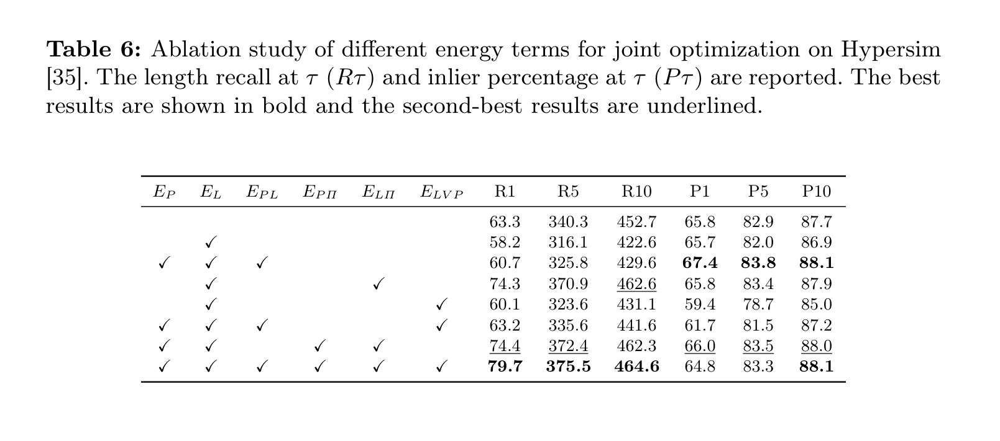

##Result

**Evaluated on two standard benchmarks** using the LIMAP evaluation framework:
- **Hypersim** [35] — 8 synthetic indoor scenes, 100 images per scene
- **Tanks and Temples** [17] — 7 real outdoor scenes (*train* split)

**Metrics:**
- *Length recall* at τ meters — how much of the GT 3D line length is recovered
- *Inlier percentage* at τ meters — fraction of tracks within τ of the GT model
- *Average supports* — average number of 2D observations per track (track completeness)

---

**Key takeaways from Tables 1 & 2:**

| | vs. L3D→[11] | vs. LIMAP [24] |
|---|---|---|
| Length recall | **+76–150%** | **+39–146%** |
| Inlier % | competitive / better | competitive / better |
| Avg supports | **+35–55%** | **+9–47%** |

- This method produces **longer and more complete line tracks** — higher recall means fewer gaps in the reconstructed map.
- Significantly **more 2D observations per track** confirms that the collinearity-aware track building groups segments more faithfully.
- Line maps are visually denser and structurally cleaner, particularly around planar surfaces and object boundaries.
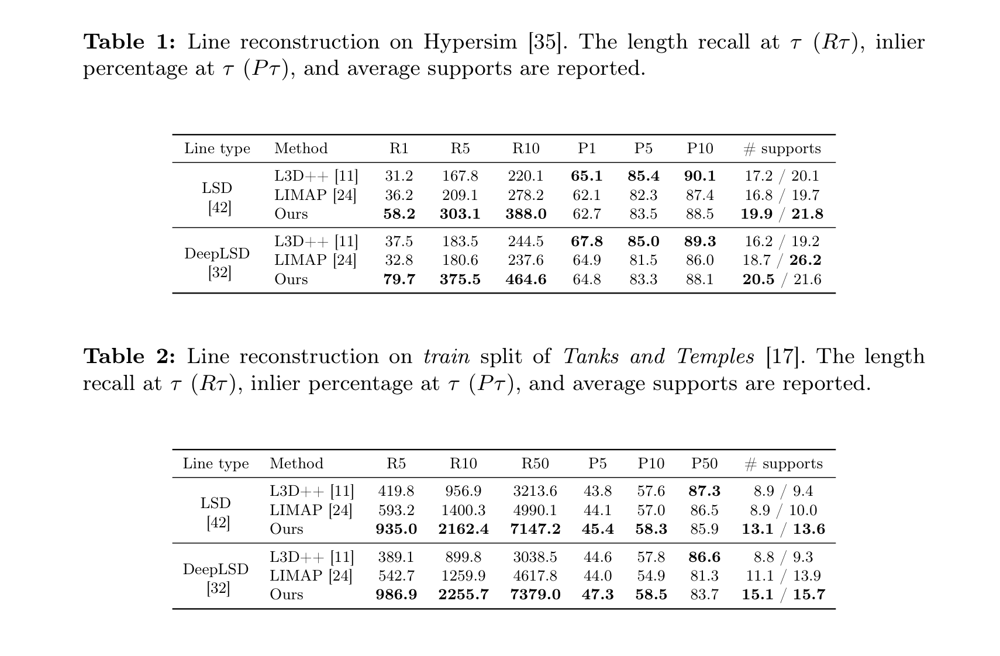